# PASSO 0 - ANÁLISE DE DADOS
#### Nesta etapa, vamos gerar samples novas utilizando os modelos Qwen 2.5 e 1.5B de parâmetros e GPT2 utilizando paráfrase. 

In [ ]:
# Execute essa célula antes das demais
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import lines
from sklearn.feature_extraction.text import CountVectorizer, ENGLISH_STOP_WORDS
from wordcloud import WordCloud

# **Checando a limpeza dos dados**

In [ ]:
mbti_df = pd.read_csv('mbti_cleaned_dataset.csv')
mbti_df[['posts', 'posts_clean']].head()

,posts,posts_clean
0,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,moment sportscenter top ten play prankswhat ha...
1,'I'm finding the lack of me in these posts ver...,im finding lack me post alarmingsex boring pos...
2,'Good one _____ https://www.youtube.com/wat...,good one course i say i know thats blessing cu...
3,"'Dear INTP, I enjoyed our conversation the o...",dear i enjoyed conversation day esoteric gabbi...
4,'You're fired.|||That's another silly misconce...,youre firedthats another silly misconception a...


In [ ]:
print("--- TEXTO ORIGINAL (Coluna 'posts') ---")
print(mbti_df['posts'].iloc[0])

print("\n--- TEXTO LIMPO (Coluna 'posts_clean') ---")
print(mbti_df['posts_clean'].iloc[0])

--- TEXTO ORIGINAL (Coluna 'posts') ---
'http://www.youtube.com/watch?v=qsXHcwe3krw|||http://41.media.tumblr.com/tumblr_lfouy03PMA1qa1rooo1_500.jpg|||enfp and intj moments  https://www.youtube.com/watch?v=iz7lE1g4XM4  sportscenter not top ten plays  https://www.youtube.com/watch?v=uCdfze1etec  pranks|||What has been the most life-changing experience in your life?|||http://www.youtube.com/watch?v=vXZeYwwRDw8   http://www.youtube.com/watch?v=u8ejam5DP3E  On repeat for most of today.|||May the PerC Experience immerse you.|||The last thing my INFJ friend posted on his facebook before committing suicide the next day. Rest in peace~   http://vimeo.com/22842206|||Hello ENFJ7. Sorry to hear of your distress. It's only natural for a relationship to not be perfection all the time in every moment of existence. Try to figure the hard times as times of growth, as...|||84389  84390  http://wallpaperpassion.com/upload/23700/friendship-boy-and-girl-wallpaper.jpg  http://assets.dornob.com/wp-content/up

# **Configurando o estilo dos gráficos**

In [ ]:
sns.set_theme(style="whitegrid")

# **Separando os eixos de personalidade**

In [ ]:
mbti_df['is_introvert'] = mbti_df['type'].apply(lambda x: 1 if x[0] == 'I' else 0)
mbti_df['is_intuitive'] = mbti_df['type'].apply(lambda x: 1 if x[1] == 'N' else 0)
mbti_df['is_feeling'] = mbti_df['type'].apply(lambda x: 1 if x[2] == 'F' else 0)
mbti_df['is_judging'] = mbti_df['type'].apply(lambda x: 1 if x[3] == 'J' else 0)

mbti_df[['type', 'is_introvert', 'is_intuitive', 'is_feeling', 'is_judging']].head(10)

,type,is_introvert,is_intuitive,is_feeling,is_judging
0,INFJ,1,1,1,1
1,ENTP,0,1,0,0
2,INTP,1,1,0,0
3,INTJ,1,1,0,1
4,ENTJ,0,1,0,1
5,INTJ,1,1,0,1
6,INFJ,1,1,1,1
7,INTJ,1,1,0,1
8,INFJ,1,1,1,1
9,INTP,1,1,0,0


# **Contando as palavras**

No primeiro momento temos uma inspeção local. Não estamos realizando cálculos matemáticos apenas observando as linhas do nosso conjunto de dados.
Os valores abaixo (333, 7554, 508, 622, 555) representam o tamanho do texto das cinco primeiras pessoas.

In [ ]:
mbti_df['word_count'] = mbti_df['posts_clean'].apply(lambda x: len(str(x).split()))
mbti_df[['posts_clean', 'word_count']].head()

,posts_clean,word_count
0,moment sportscenter top ten play prankswhat ha...,333
1,im finding lack me post alarmingsex boring pos...,754
2,good one course i say i know thats blessing cu...,508
3,dear i enjoyed conversation day esoteric gabbi...,622
4,youre firedthats another silly misconception a...,555


Agora, utilizando o comando '.describe()', ao invés de olharmos para os indivíduos, vamos olhar para toda a base de dados e retornar um sumário estatístico do comportamento geral da variável 'word_count'.
Os números significam:


*   **count** (8675) : o número total de linhas na nossa base de dados.
*   **mean** (725.89) : a média --> se somarmos todas as palavras de todo mundo e dividirmos pelo total de pessoas, temos uma média de 726 palavras por post.
*   **std** (175.17) : o desvio padrão
*   **min** (3.0) : o menor texto de toda a base de dados tem somente 3 palavras.
*   **50%** (757.0) : a mediana.
*   **75%** (854.0) : o terceiro quartil.
*   **max** (1166.0) : o maior texto de toda a base tem 1166 palavras.


In [ ]:
mbti_df['word_count'] = mbti_df['posts_clean'].apply(lambda x: len(str(x).split()))
mbti_df['word_count'].describe()

,word_count
count,8675.000000
mean,725.896715
std,175.177953
min,3.000000
25%,629.000000
50%,757.000000
75%,854.000000
max,1166.000000


# **Gráfico das 16 personalidades**

/tmp/ipykernel_774/593006324.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=mbti_df, x='type', order=order, palette='viridis')


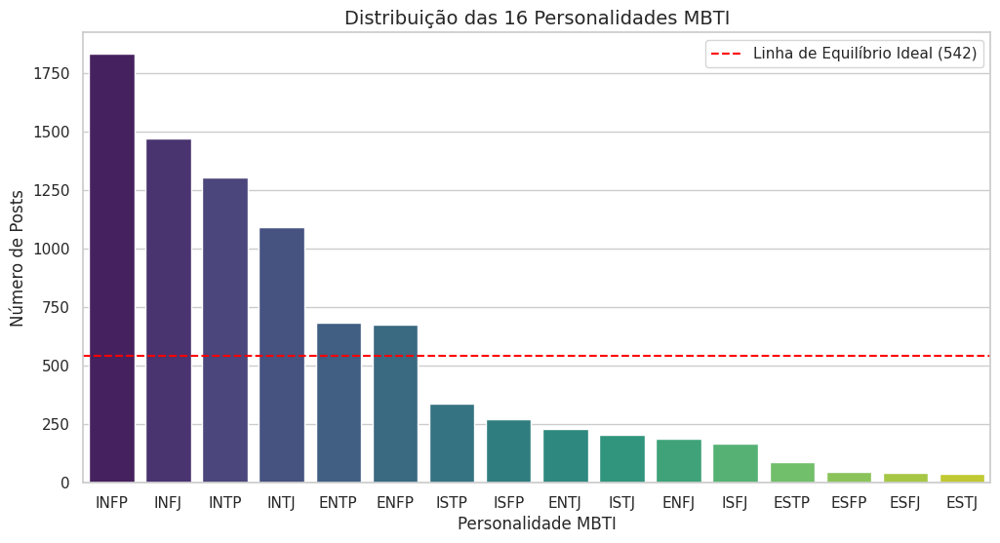

In [ ]:
plt.figure(figsize=(12, 6))

order = mbti_df['type'].value_counts().index
ax = sns.countplot(data=mbti_df, x='type', order=order, palette='viridis')

plt.title('Distribuição das 16 Personalidades MBTI', fontsize=14)
plt.ylabel('Número de Posts')
plt.xlabel('Personalidade MBTI')

ideal_count = len(mbti_df) / 16
plt.axhline(ideal_count, color='red', linestyle='--', label=f'Linha de Equilíbrio Ideal ({ideal_count:.0f})')
plt.legend()
plt.show()

# **Gráfico dos 4 Eixos**
*   Introvert (I) vs Extrovert (E)
*   Sensing (S) vs Intuitive (N)
*   Feeling (F) vs Thinking (T)
*   Judging (J) vs Perceiving (P)





/tmp/ipykernel_774/458118506.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(ax=axes[0, 0], data=mbti_df, x='is_introvert', palette=['#AEC7E8', '#1F77B4'])
/tmp/ipykernel_774/458118506.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0, 0].set_xticklabels(['0 (Extrovert)', '1 (Introvert)'])
/tmp/ipykernel_774/458118506.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(ax=axes[0, 1], data=mbti_df, x='is_intuitive', palette=['#98DF8A', '#2CA02C'])
/tmp/ipykernel_774/458118506.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or usi

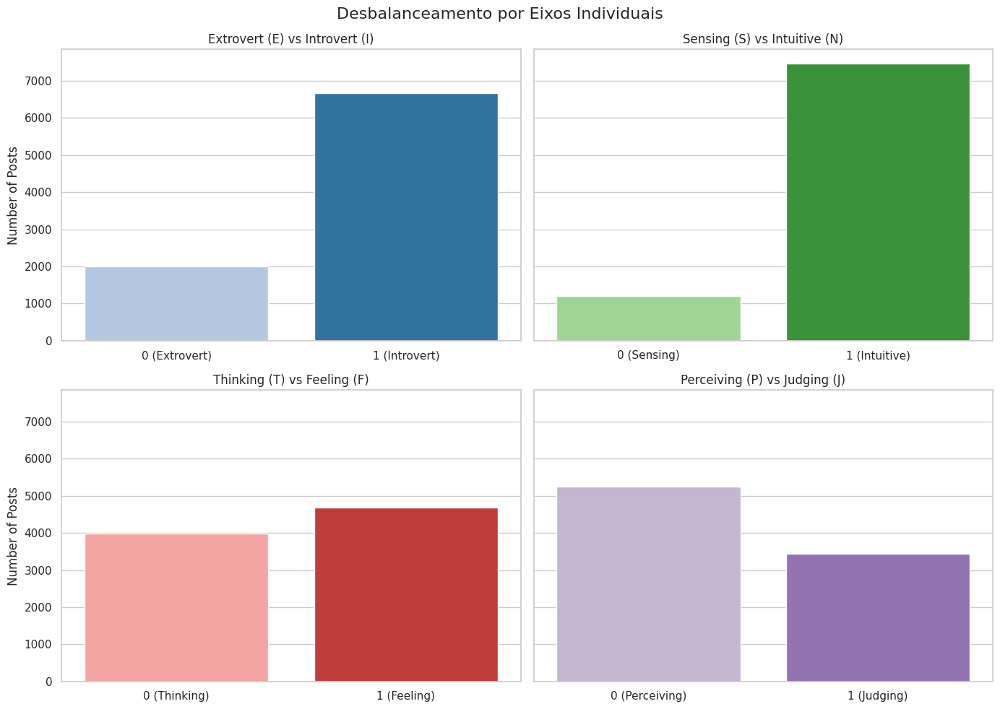

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True)
fig.suptitle('Desbalanceamento por Eixos Individuais', fontsize=16)


#Gráfico 1: Introvert vs Extrovert
sns.countplot(ax=axes[0, 0], data=mbti_df, x='is_introvert', palette=['#AEC7E8', '#1F77B4'])
axes[0, 0].set_title('Extrovert (E) vs Introvert (I)')
axes[0, 0].set_xticklabels(['0 (Extrovert)', '1 (Introvert)'])
axes[0, 0].set_xlabel('')
axes[0, 0].set_ylabel('Number of Posts')

#Gráfico 2: Sensing vs Intuitive
sns.countplot(ax=axes[0, 1], data=mbti_df, x='is_intuitive', palette=['#98DF8A', '#2CA02C'])
axes[0, 1].set_title('Sensing (S) vs Intuitive (N)')
axes[0, 1].set_xticklabels(['0 (Sensing)', '1 (Intuitive)'])
axes[0, 1].set_xlabel('')

#Gráfico 3: Thinking vs Feeling
sns.countplot(ax=axes[1, 0], data=mbti_df, x='is_feeling', palette=['#FF9896', '#D62728'])
axes[1, 0].set_title('Thinking (T) vs Feeling (F)')
axes[1, 0].set_xticklabels(['0 (Thinking)', '1 (Feeling)'])
axes[1, 0].set_xlabel('')
axes[1, 0].set_ylabel('Number of Posts')

#Gráfico 4: Judging vs Perceiving
sns.countplot(ax=axes[1, 1], data=mbti_df, x='is_judging', palette=['#C5B0D5', '#9467BD'])
axes[1, 1].set_title('Perceiving (P) vs Judging (J)')
axes[1, 1].set_xticklabels(['0 (Perceiving)', '1 (Judging)'])
axes[1, 1].set_xlabel('')

plt.tight_layout()
plt.show()

Ao isolar e analisar os quatro eixos do MBTI de forma independente, ficou evidente que as dimensões de **Itroversion** (I) e **Intuition** (N) dominam massivamente  o volume de postagens disponíveis, enquanto que os traços de **Extroversion** (E) e **Sensing** (S) representam minorias críticas. O eixo Judging/Perceiving (J/P) apresentou um desnível moderado e o eixo Thinking/Feeling (T/F) manteve-se estável.
Esse cenário impõe um desafio ao treinamento da IA: se utilizarmos os dados no estado atual (baseline), o classificador desenvolverá um viés estatístico forte, tendendo a classificar novos textos como 'I' e 'N' simplesmente pela probabilidade prévia (maior volume de exemplos), ignorando padrões linguísticos sutis das classes minoritárias.
Portanto, para garantir a eficácia do nosso modelo, concentraremos as técnicas de geração de dados artificiais na síntese e expansão de textos para as classes Extrovert (E) e Sensing (S).

# **Análise da Frequência Lexical**

Durante a análise dos dados, constatamos que a limpeza inicial realizada no pré-processamento, embora fundamental para a padronização estrutural do texto (remoção de URLs, pontuação excessiva e uniformização em letras minúsculas), não foi o suficiente para a extração de inteligência semântica. A aplicação direta de contagem de frequência nos dados pré-processados revelou a predominância absoluta de conectivos comuns do inglês e artefatos de limpeza (como "im" e "dont"), mascarando o vocabulário distintivo das personalidades. Isso tornou necessária a implementação de uma segunda camada de filtragem focada em "Stop Words".

No entanto, a simples aplicação de blibliotecas padrão de Stop Words (como as do Scikit-Learn ou NLTK) apresentava um risco metodológico severo. Por isso, optamos pelo desenvolvimento de um Dicionário Customizado (Custom Stop Words), guiado por três princípios fundamentais:



1.   Preservação de Marcadores Psicolinguísticos
      
      Bibliotecas genéricas removem automaticamente pronomes de primeira pessoa e segunda pessoa. Contudo, na literatura de psicolinguística, a frequência e o uso desses pronomes ("I", "we", "me") são marcadores fortíssimos não apenas para o eixo de Introversão/Extroversão, mas também atuam como modificadores de contexto para os eixos de Razão/Emoção (T/F) e Julgamento/Percepção (J/P). Ao criarmos exceções para manter esses pronomes, preservamos features vitais que o algoritmo utilizará para mapear o foco interno ou externo do autor.
2.   Eliminação do Ruído de Domínio (Forum Noise)

      O dataset tem origem em fóruns de internet e analisando os dados, constatamos que palavras como "like", "think", "people" e  "really" dominavam o topo da frequência lexical em absolutamente todas as 16 personalidades e em todos os polos dos quatro eixos. Esse ruído de domínio gera uma sobreposição semântica que cega os classificadores. A adição manual dessas gírias conversacionais à nossa lista de remoção permitiu "descascar" a camada superficial da internet, revelando as palavras que realmente diferenciam as classes.

3. Prevenção da Poda Excessiva (Over-Pruning)

      Continuar expandindo a lista de exclusão apenas para forçar uma diferenciação visual artificial entre as classes resultaria em Over-Pruning. É um fato inerente à comunicação que os diferentes tipos de personalidade utilizem palavras comuns como "life" e "friends". O que os diferencia é a estruturação e o peso sintático no contexto da frase. Apagar esses termos comuns forçaria uma distorção irreal no dataset, privando a IA de aprender as nuances reais da linguagem natural.



# Eixos antes da segunda filtragem

/tmp/ipykernel_774/2010393226.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_I.values()), y=list(top_words_I.keys()), palette='Blues_r')
/tmp/ipykernel_774/2010393226.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_E.values()), y=list(top_words_E.keys()), palette='Oranges_r')


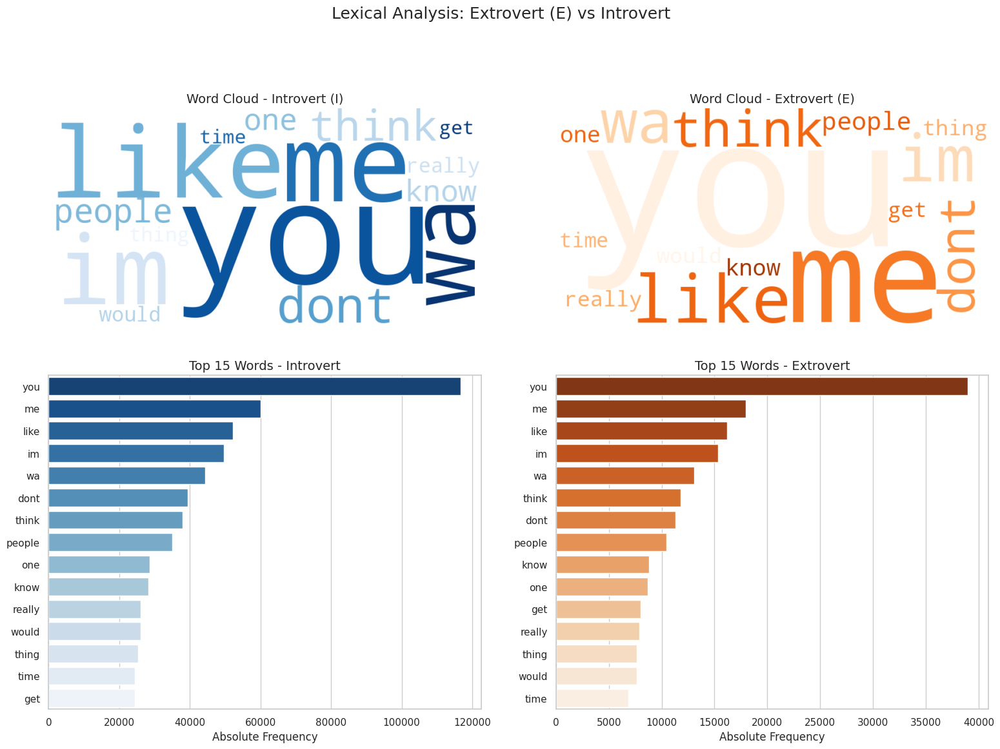

In [ ]:
#Eixo Extrovert vs Introvert
introvert_texts = mbti_df[mbti_df['is_introvert'] == 1]['posts_clean']
extrovert_texts = mbti_df[mbti_df['is_introvert'] == 0]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer().fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_I = dict(get_top_n_words(introvert_texts, 15))
top_words_E = dict(get_top_n_words(extrovert_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Extrovert (E) vs Introvert', fontsize=18)


# Nuvem Introvertidos
wc_I = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate_from_frequencies(top_words_I)
axes[0, 0].imshow(wc_I, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Introvert (I)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Extrovertidos
wc_E = WordCloud(width=800, height=400, background_color='white', colormap='Oranges').generate_from_frequencies(top_words_E)
axes[0, 1].imshow(wc_E, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Extrovert (E)', fontsize=14)
axes[0, 1].axis('off')

# Barras Introvertidos
sns.barplot(ax=axes[1, 0], x=list(top_words_I.values()), y=list(top_words_I.keys()), palette='Blues_r')
axes[1, 0].set_title('Top 15 Words - Introvert', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Extrovertidos
sns.barplot(ax=axes[1, 1], x=list(top_words_E.values()), y=list(top_words_E.keys()), palette='Oranges_r')
axes[1, 1].set_title('Top 15 Words - Extrovert', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/2653264863.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_S.values()), y=list(top_words_S.keys()), palette='Greens_r')
/tmp/ipykernel_774/2653264863.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_N.values()), y=list(top_words_N.keys()), palette='Purples_r')


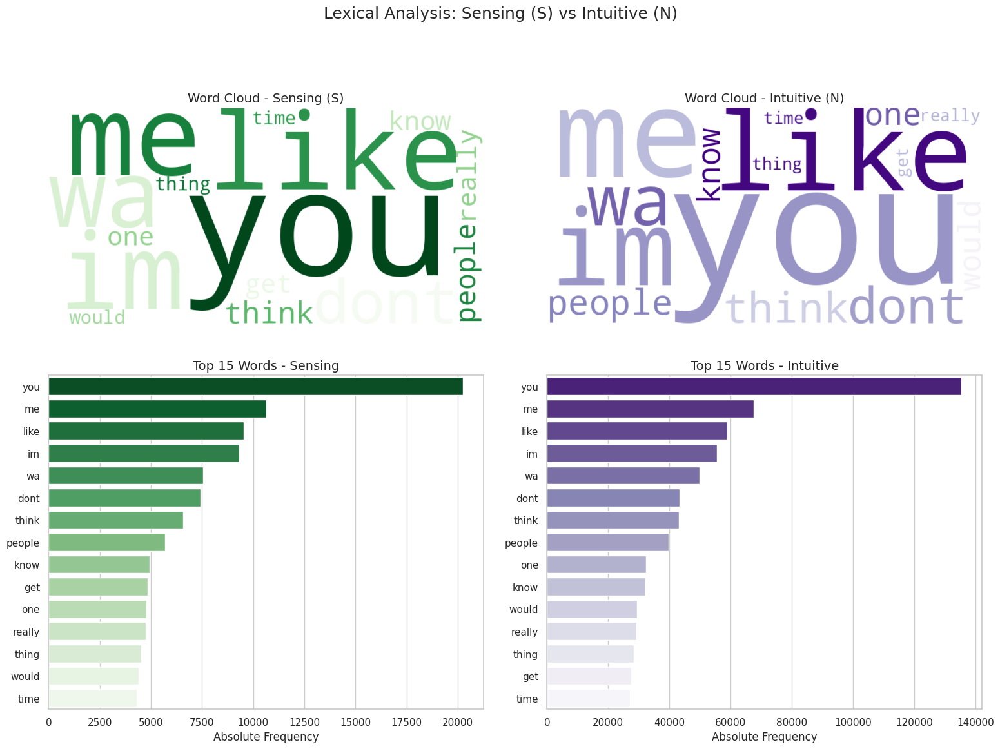

In [ ]:
#Eixo Sensing vs Intuitive
sensing_texts = mbti_df[mbti_df['is_intuitive'] == 0]['posts_clean']
intuitive_texts = mbti_df[mbti_df['is_intuitive'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer().fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_S = dict(get_top_n_words(sensing_texts, 15))
top_words_N = dict(get_top_n_words(intuitive_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Sensing (S) vs Intuitive (N)', fontsize=18)


# Nuvem Sensitivos
wc_S = WordCloud(width=800, height=400, background_color='white', colormap='Greens').generate_from_frequencies(top_words_S)
axes[0, 0].imshow(wc_S, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Sensing (S)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Intuitivos
wc_N = WordCloud(width=800, height=400, background_color='white', colormap='Purples').generate_from_frequencies(top_words_N)
axes[0, 1].imshow(wc_N, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Intuitive (N)', fontsize=14)
axes[0, 1].axis('off')

# Barras Sensitivos
sns.barplot(ax=axes[1, 0], x=list(top_words_S.values()), y=list(top_words_S.keys()), palette='Greens_r')
axes[1, 0].set_title('Top 15 Words - Sensing', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Intuitivos
sns.barplot(ax=axes[1, 1], x=list(top_words_N.values()), y=list(top_words_N.keys()), palette='Purples_r')
axes[1, 1].set_title('Top 15 Words - Intuitive', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/1288592039.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_T.values()), y=list(top_words_T.keys()), palette='Greys_r')
/tmp/ipykernel_774/1288592039.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_F.values()), y=list(top_words_F.keys()), palette='Reds_r')


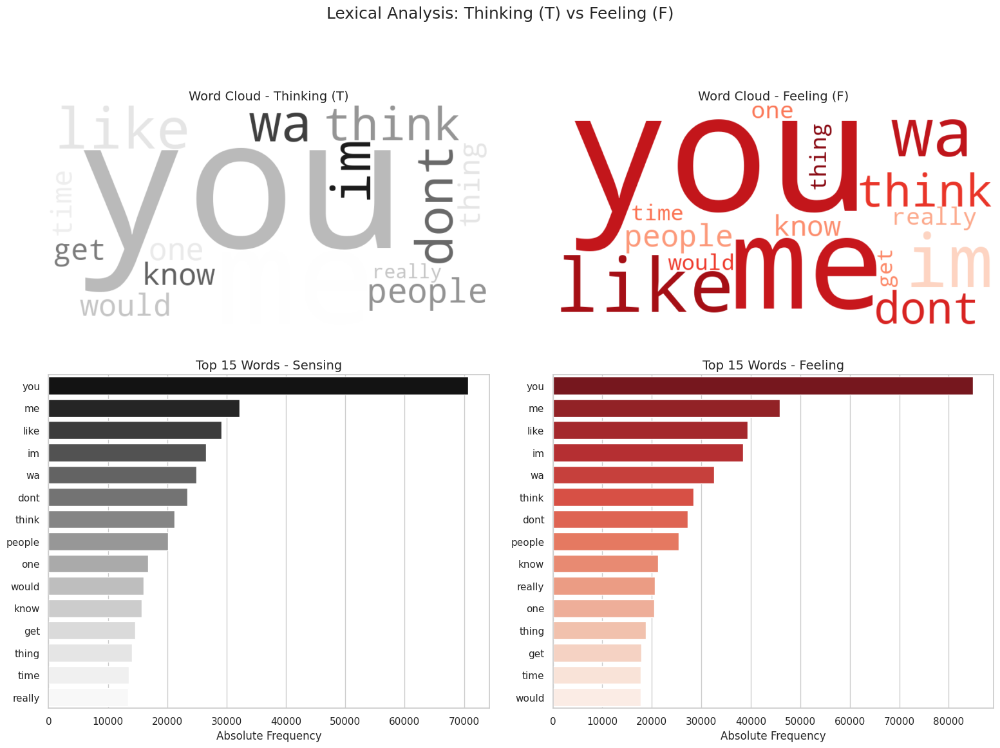

In [ ]:
#Eixo Thinking vs Feeling
thinking_texts = mbti_df[mbti_df['is_feeling'] == 0]['posts_clean']
feeling_texts = mbti_df[mbti_df['is_feeling'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer().fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_T = dict(get_top_n_words(thinking_texts, 15))
top_words_F = dict(get_top_n_words(feeling_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Thinking (T) vs Feeling (F)', fontsize=18)

# Nuvem Thinking
wc_T = WordCloud(width=800, height=400, background_color='white', colormap='Greys').generate_from_frequencies(top_words_T)
axes[0, 0].imshow(wc_T, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Thinking (T)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Feeling
wc_F = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate_from_frequencies(top_words_F)
axes[0, 1].imshow(wc_F, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Feeling (F)', fontsize=14)
axes[0, 1].axis('off')

# Barras Thinking
sns.barplot(ax=axes[1, 0], x=list(top_words_T.values()), y=list(top_words_T.keys()), palette='Greys_r')
axes[1, 0].set_title('Top 15 Words - Sensing', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Feeling
sns.barplot(ax=axes[1, 1], x=list(top_words_F.values()), y=list(top_words_F.keys()), palette='Reds_r')
axes[1, 1].set_title('Top 15 Words - Feeling', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/3198767895.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_P.values()), y=list(top_words_P.keys()), palette='YlOrBr_r')
/tmp/ipykernel_774/3198767895.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_J.values()), y=list(top_words_J.keys()), palette='GnBu_r')


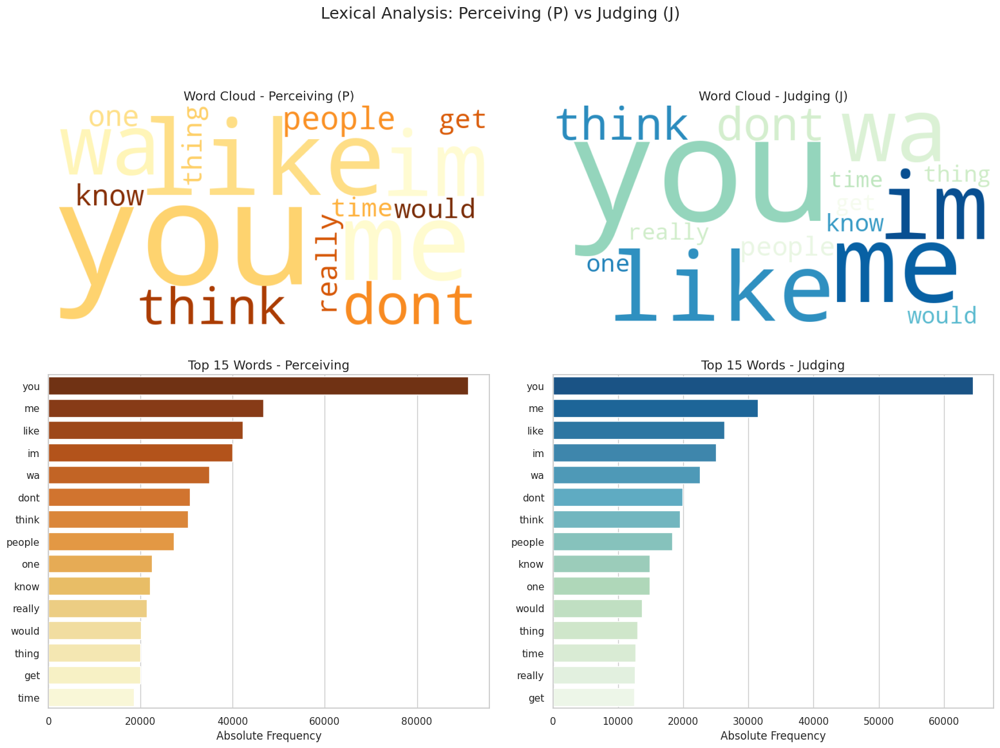

In [ ]:
#Eixo Perceiving vs Judging
perceiving_texts = mbti_df[mbti_df['is_judging'] == 0]['posts_clean']
judging_texts = mbti_df[mbti_df['is_judging'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer().fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_P = dict(get_top_n_words(perceiving_texts, 15))
top_words_J = dict(get_top_n_words(judging_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Perceiving (P) vs Judging (J)', fontsize=18)


# Nuvem Perceiving
wc_P = WordCloud(width=800, height=400, background_color='white', colormap='YlOrBr').generate_from_frequencies(top_words_P)
axes[0, 0].imshow(wc_P, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Perceiving (P)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Judging
wc_J = WordCloud(width=800, height=400, background_color='white', colormap='GnBu').generate_from_frequencies(top_words_J)
axes[0, 1].imshow(wc_J, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Judging (J)', fontsize=14)
axes[0, 1].axis('off')

# Barras Perceiving
sns.barplot(ax=axes[1, 0], x=list(top_words_P.values()), y=list(top_words_P.keys()), palette='YlOrBr_r')
axes[1, 0].set_title('Top 15 Words - Perceiving', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Judging
sns.barplot(ax=axes[1, 1], x=list(top_words_J.values()), y=list(top_words_J.keys()), palette='GnBu_r')
axes[1, 1].set_title('Top 15 Words - Judging', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

# Eixos removendo apenas stop words

/tmp/ipykernel_774/444638440.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_I.values()), y=list(top_words_I.keys()), palette='Blues_r')
/tmp/ipykernel_774/444638440.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_E.values()), y=list(top_words_E.keys()), palette='Oranges_r')


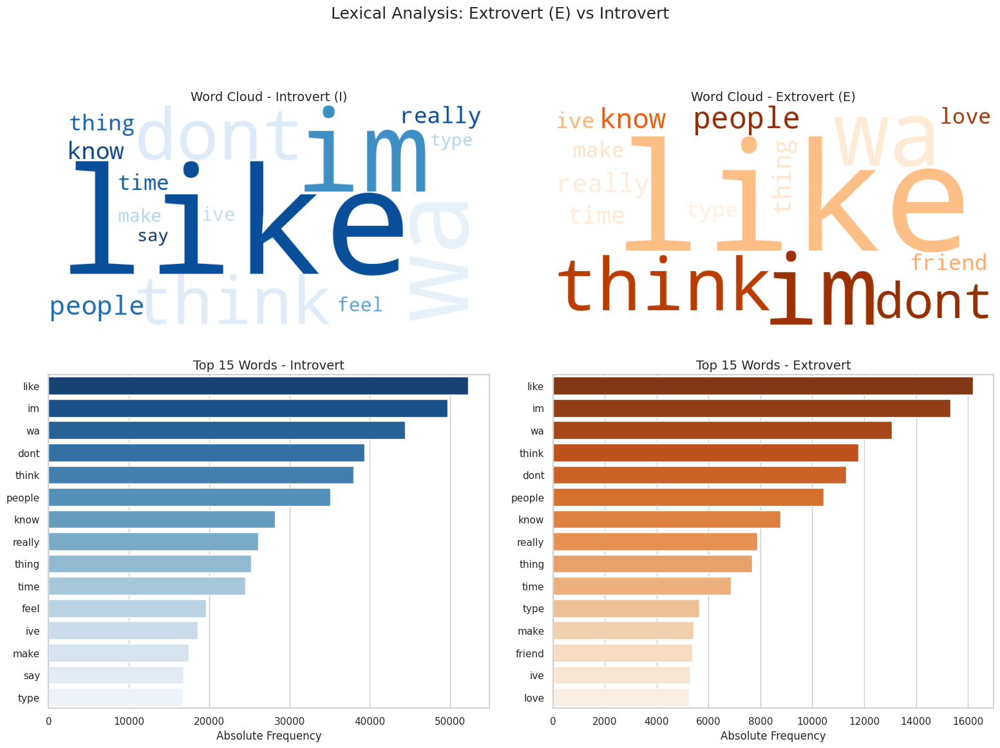

In [ ]:
#Eixo Extrovert vs Introvert
introvert_texts = mbti_df[mbti_df['is_introvert'] == 1]['posts_clean']
extrovert_texts = mbti_df[mbti_df['is_introvert'] == 0]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words='english').fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_I = dict(get_top_n_words(introvert_texts, 15))
top_words_E = dict(get_top_n_words(extrovert_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Extrovert (E) vs Introvert', fontsize=18)

# Nuvem Introvertidos
wc_I = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate_from_frequencies(top_words_I)
axes[0, 0].imshow(wc_I, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Introvert (I)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Extrovertidos
wc_E = WordCloud(width=800, height=400, background_color='white', colormap='Oranges').generate_from_frequencies(top_words_E)
axes[0, 1].imshow(wc_E, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Extrovert (E)', fontsize=14)
axes[0, 1].axis('off')

# Barras Introvertidos
sns.barplot(ax=axes[1, 0], x=list(top_words_I.values()), y=list(top_words_I.keys()), palette='Blues_r')
axes[1, 0].set_title('Top 15 Words - Introvert', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Extrovertidos
sns.barplot(ax=axes[1, 1], x=list(top_words_E.values()), y=list(top_words_E.keys()), palette='Oranges_r')
axes[1, 1].set_title('Top 15 Words - Extrovert', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/1207322513.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_S.values()), y=list(top_words_S.keys()), palette='Greens_r')
/tmp/ipykernel_774/1207322513.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_N.values()), y=list(top_words_N.keys()), palette='Purples_r')


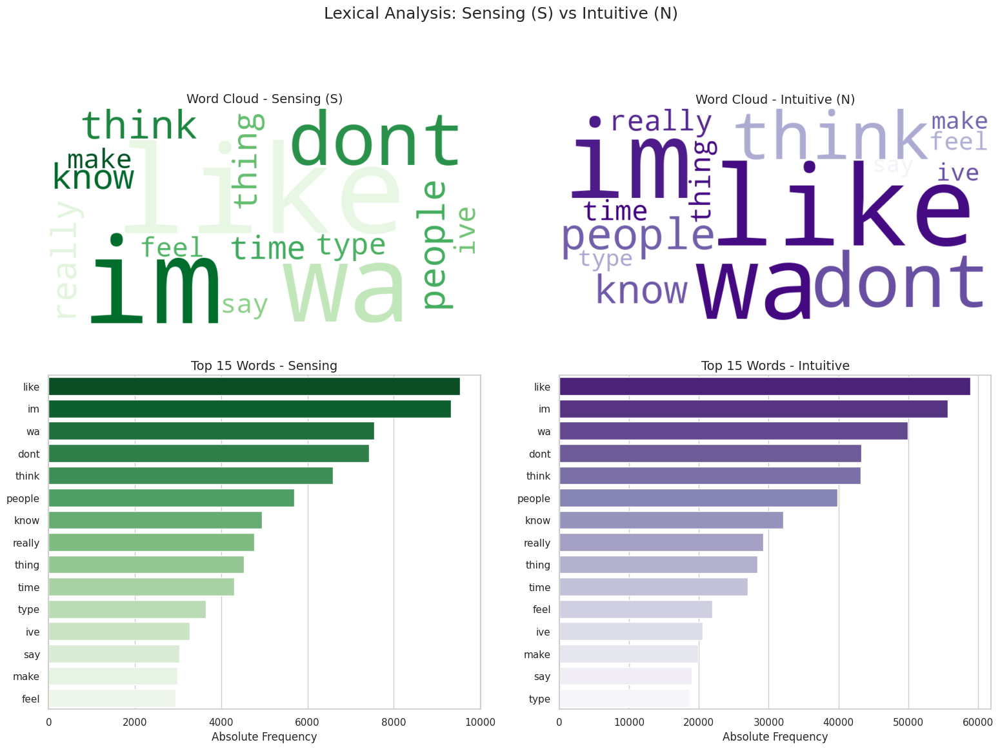

In [ ]:
#Eixo Sensing vs Intuitive
sensing_texts = mbti_df[mbti_df['is_intuitive'] == 0]['posts_clean']
intuitive_texts = mbti_df[mbti_df['is_intuitive'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words='english').fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_S = dict(get_top_n_words(sensing_texts, 15))
top_words_N = dict(get_top_n_words(intuitive_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Sensing (S) vs Intuitive (N)', fontsize=18)


# Nuvem Sensitivos
wc_S = WordCloud(width=800, height=400, background_color='white', colormap='Greens').generate_from_frequencies(top_words_S)
axes[0, 0].imshow(wc_S, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Sensing (S)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Intuitivos
wc_N = WordCloud(width=800, height=400, background_color='white', colormap='Purples').generate_from_frequencies(top_words_N)
axes[0, 1].imshow(wc_N, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Intuitive (N)', fontsize=14)
axes[0, 1].axis('off')

# Barras Sensitivos
sns.barplot(ax=axes[1, 0], x=list(top_words_S.values()), y=list(top_words_S.keys()), palette='Greens_r')
axes[1, 0].set_title('Top 15 Words - Sensing', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Intuitivos
sns.barplot(ax=axes[1, 1], x=list(top_words_N.values()), y=list(top_words_N.keys()), palette='Purples_r')
axes[1, 1].set_title('Top 15 Words - Intuitive', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/2600116592.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_T.values()), y=list(top_words_T.keys()), palette='Greys_r')
/tmp/ipykernel_774/2600116592.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_F.values()), y=list(top_words_F.keys()), palette='Reds_r')


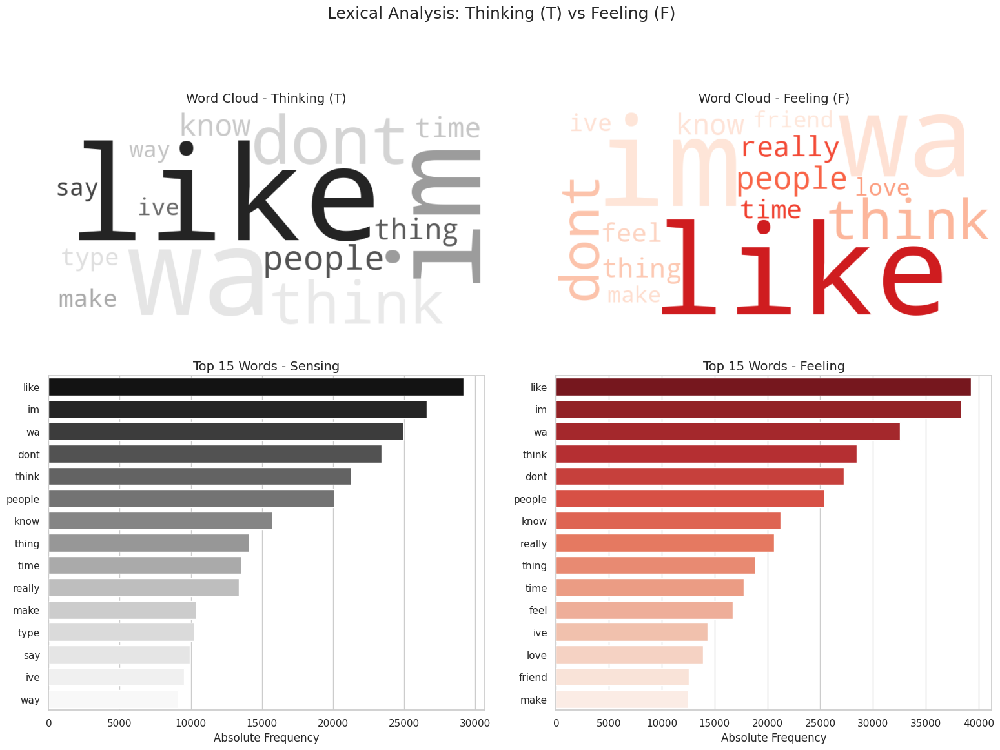

In [ ]:
#Eixo Thinking vs Feeling
thinking_texts = mbti_df[mbti_df['is_feeling'] == 0]['posts_clean']
feeling_texts = mbti_df[mbti_df['is_feeling'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words='english').fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_T = dict(get_top_n_words(thinking_texts, 15))
top_words_F = dict(get_top_n_words(feeling_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Thinking (T) vs Feeling (F)', fontsize=18)


# Nuvem Thinking
wc_T = WordCloud(width=800, height=400, background_color='white', colormap='Greys').generate_from_frequencies(top_words_T)
axes[0, 0].imshow(wc_T, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Thinking (T)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Feeling
wc_F = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate_from_frequencies(top_words_F)
axes[0, 1].imshow(wc_F, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Feeling (F)', fontsize=14)
axes[0, 1].axis('off')

# Barras Thinking
sns.barplot(ax=axes[1, 0], x=list(top_words_T.values()), y=list(top_words_T.keys()), palette='Greys_r')
axes[1, 0].set_title('Top 15 Words - Sensing', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Feeling
sns.barplot(ax=axes[1, 1], x=list(top_words_F.values()), y=list(top_words_F.keys()), palette='Reds_r')
axes[1, 1].set_title('Top 15 Words - Feeling', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/4157159217.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_P.values()), y=list(top_words_P.keys()), palette='YlOrBr_r')
/tmp/ipykernel_774/4157159217.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_J.values()), y=list(top_words_J.keys()), palette='GnBu_r')


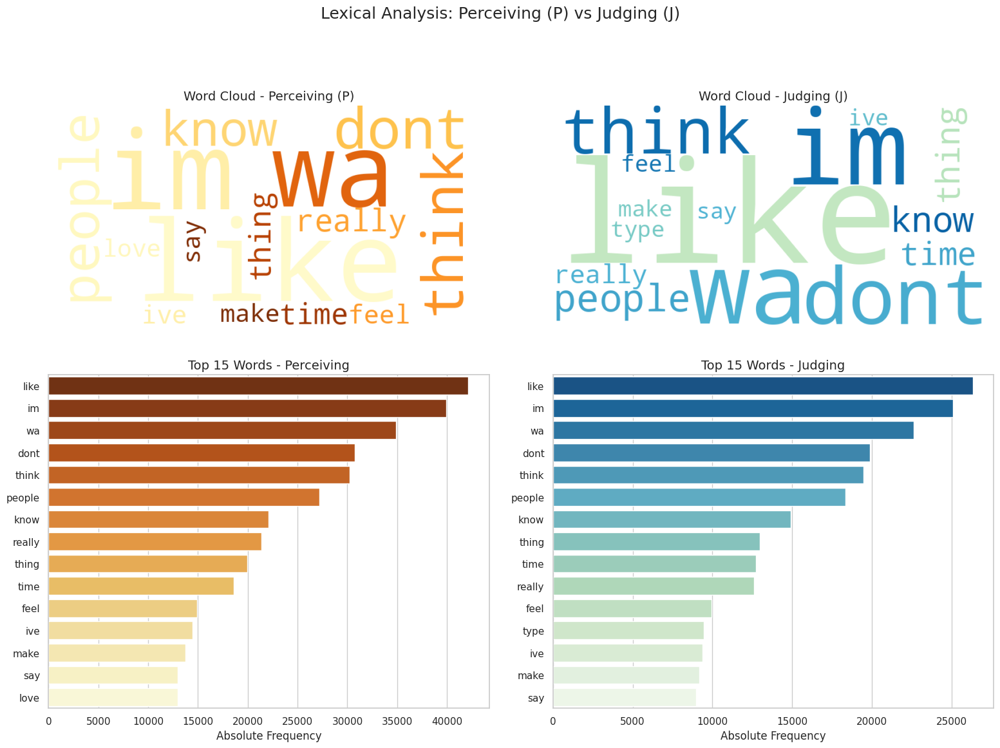

In [ ]:
#Eixo Perceiving vs Judging
perceiving_texts = mbti_df[mbti_df['is_judging'] == 0]['posts_clean']
judging_texts = mbti_df[mbti_df['is_judging'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words='english').fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_P = dict(get_top_n_words(perceiving_texts, 15))
top_words_J = dict(get_top_n_words(judging_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Perceiving (P) vs Judging (J)', fontsize=18)


# Nuvem Perceiving
wc_P = WordCloud(width=800, height=400, background_color='white', colormap='YlOrBr').generate_from_frequencies(top_words_P)
axes[0, 0].imshow(wc_P, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Perceiving (P)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Judging
wc_J = WordCloud(width=800, height=400, background_color='white', colormap='GnBu').generate_from_frequencies(top_words_J)
axes[0, 1].imshow(wc_J, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Judging (J)', fontsize=14)
axes[0, 1].axis('off')

# Barras Perceiving
sns.barplot(ax=axes[1, 0], x=list(top_words_P.values()), y=list(top_words_P.keys()), palette='YlOrBr_r')
axes[1, 0].set_title('Top 15 Words - Perceiving', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Judging
sns.barplot(ax=axes[1, 1], x=list(top_words_J.values()), y=list(top_words_J.keys()), palette='GnBu_r')
axes[1, 1].set_title('Top 15 Words - Judging', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

# Eixos removendo stop words customizadas

/tmp/ipykernel_774/2517485201.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_I.values()), y=list(top_words_I.keys()), palette='Blues_r')
/tmp/ipykernel_774/2517485201.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_E.values()), y=list(top_words_E.keys()), palette='Oranges_r')


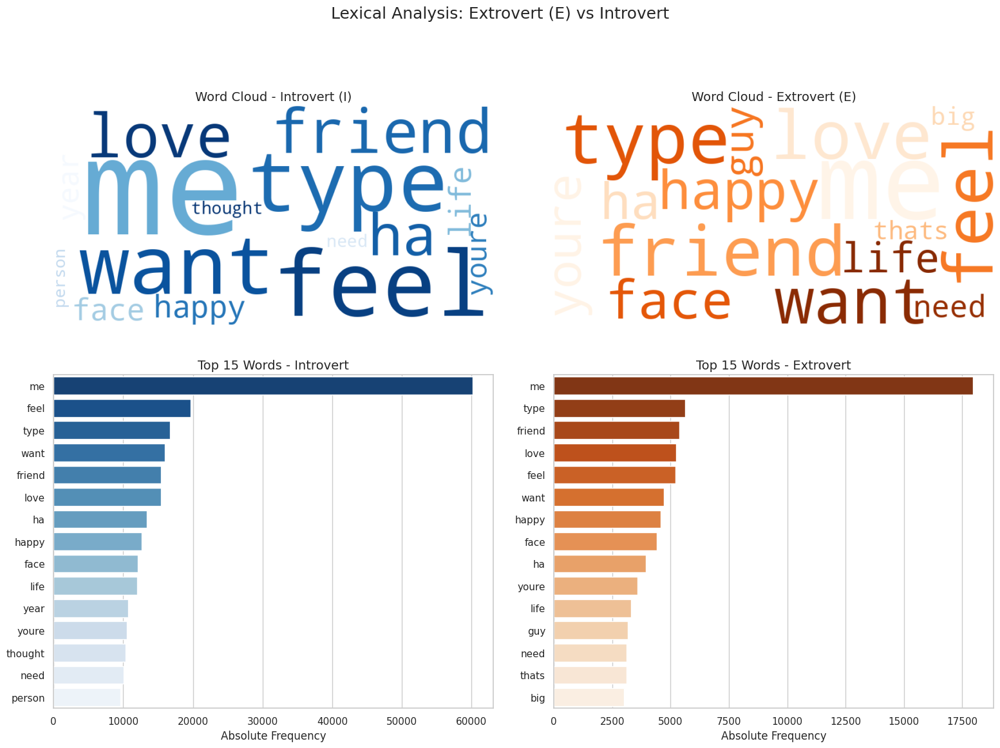

In [ ]:
words_to_keep = {"i", "me", "my", "mine", "myself", "we", "us", "our"}
forum_noise = {"im", "dont", "wa", "like", "think", "people", "know", "really", "thing", "time", "say", "make", "ive", "just", "lot", "good", "way"}
custom_stop_words = (set(ENGLISH_STOP_WORDS) | forum_noise) - words_to_keep

#Eixo Extrovert vs Introvert
introvert_texts = mbti_df[mbti_df['is_introvert'] == 1]['posts_clean']
extrovert_texts = mbti_df[mbti_df['is_introvert'] == 0]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words=list(custom_stop_words)).fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_I = dict(get_top_n_words(introvert_texts, 15))
top_words_E = dict(get_top_n_words(extrovert_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Extrovert (E) vs Introvert', fontsize=18)


# Nuvem Introvertidos
wc_I = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate_from_frequencies(top_words_I)
axes[0, 0].imshow(wc_I, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Introvert (I)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Extrovertidos
wc_E = WordCloud(width=800, height=400, background_color='white', colormap='Oranges').generate_from_frequencies(top_words_E)
axes[0, 1].imshow(wc_E, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Extrovert (E)', fontsize=14)
axes[0, 1].axis('off')

# Barras Introvertidos
sns.barplot(ax=axes[1, 0], x=list(top_words_I.values()), y=list(top_words_I.keys()), palette='Blues_r')
axes[1, 0].set_title('Top 15 Words - Introvert', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Extrovertidos
sns.barplot(ax=axes[1, 1], x=list(top_words_E.values()), y=list(top_words_E.keys()), palette='Oranges_r')
axes[1, 1].set_title('Top 15 Words - Extrovert', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/1886938733.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_S.values()), y=list(top_words_S.keys()), palette='Greens_r')
/tmp/ipykernel_774/1886938733.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_N.values()), y=list(top_words_N.keys()), palette='Purples_r')


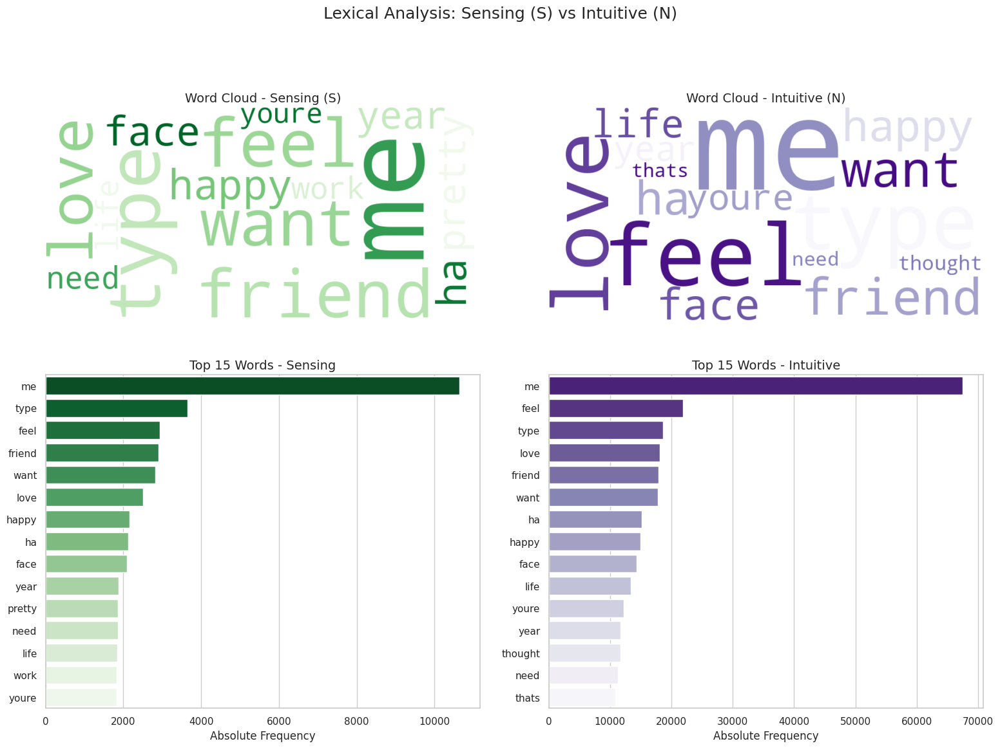

In [ ]:
#Eixo Sensing vs Intuitive
sensing_texts = mbti_df[mbti_df['is_intuitive'] == 0]['posts_clean']
intuitive_texts = mbti_df[mbti_df['is_intuitive'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words=list(custom_stop_words)).fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_S = dict(get_top_n_words(sensing_texts, 15))
top_words_N = dict(get_top_n_words(intuitive_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Sensing (S) vs Intuitive (N)', fontsize=18)


# Nuvem Sensitivos
wc_S = WordCloud(width=800, height=400, background_color='white', colormap='Greens').generate_from_frequencies(top_words_S)
axes[0, 0].imshow(wc_S, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Sensing (S)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Intuitivos
wc_N = WordCloud(width=800, height=400, background_color='white', colormap='Purples').generate_from_frequencies(top_words_N)
axes[0, 1].imshow(wc_N, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Intuitive (N)', fontsize=14)
axes[0, 1].axis('off')

# Barras Sensitivos
sns.barplot(ax=axes[1, 0], x=list(top_words_S.values()), y=list(top_words_S.keys()), palette='Greens_r')
axes[1, 0].set_title('Top 15 Words - Sensing', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Intuitivos
sns.barplot(ax=axes[1, 1], x=list(top_words_N.values()), y=list(top_words_N.keys()), palette='Purples_r')
axes[1, 1].set_title('Top 15 Words - Intuitive', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/284543434.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_T.values()), y=list(top_words_T.keys()), palette='Greys_r')
/tmp/ipykernel_774/284543434.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_F.values()), y=list(top_words_F.keys()), palette='Reds_r')


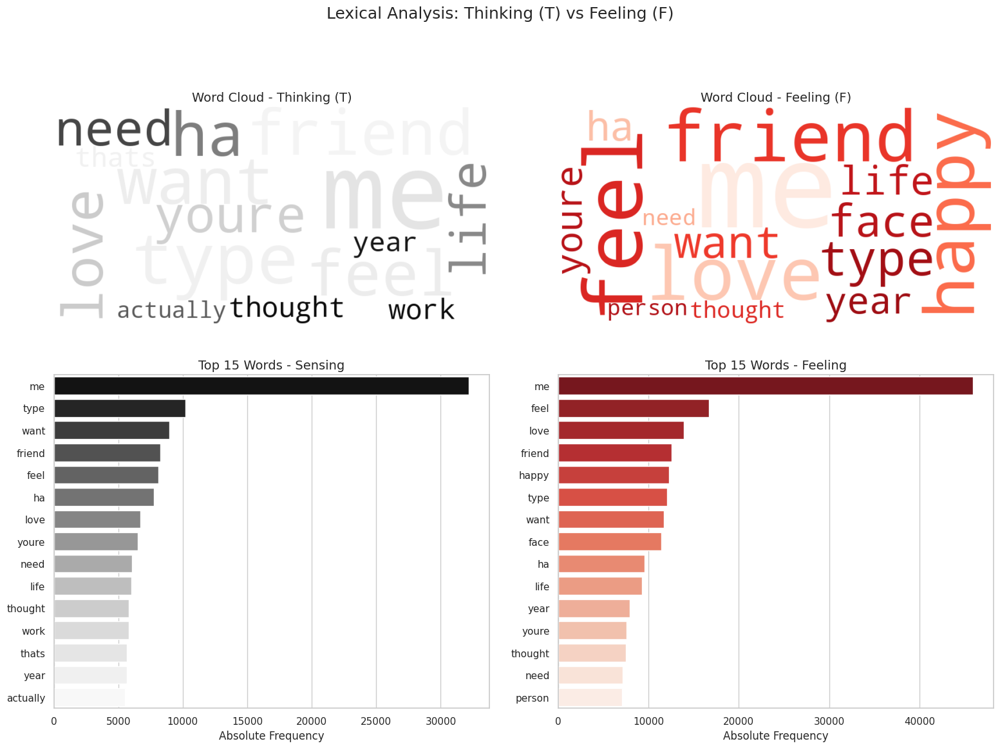

In [ ]:
#Eixo Thinking vs Feeling
thinking_texts = mbti_df[mbti_df['is_feeling'] == 0]['posts_clean']
feeling_texts = mbti_df[mbti_df['is_feeling'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words=list(custom_stop_words)).fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_T = dict(get_top_n_words(thinking_texts, 15))
top_words_F = dict(get_top_n_words(feeling_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Thinking (T) vs Feeling (F)', fontsize=18)


# Nuvem Thinking
wc_T = WordCloud(width=800, height=400, background_color='white', colormap='Greys').generate_from_frequencies(top_words_T)
axes[0, 0].imshow(wc_T, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Thinking (T)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Feeling
wc_F = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate_from_frequencies(top_words_F)
axes[0, 1].imshow(wc_F, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Feeling (F)', fontsize=14)
axes[0, 1].axis('off')

# Barras Thinking
sns.barplot(ax=axes[1, 0], x=list(top_words_T.values()), y=list(top_words_T.keys()), palette='Greys_r')
axes[1, 0].set_title('Top 15 Words - Sensing', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Feeling
sns.barplot(ax=axes[1, 1], x=list(top_words_F.values()), y=list(top_words_F.keys()), palette='Reds_r')
axes[1, 1].set_title('Top 15 Words - Feeling', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

/tmp/ipykernel_774/2423198515.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 0], x=list(top_words_P.values()), y=list(top_words_P.keys()), palette='YlOrBr_r')
/tmp/ipykernel_774/2423198515.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[1, 1], x=list(top_words_J.values()), y=list(top_words_J.keys()), palette='GnBu_r')


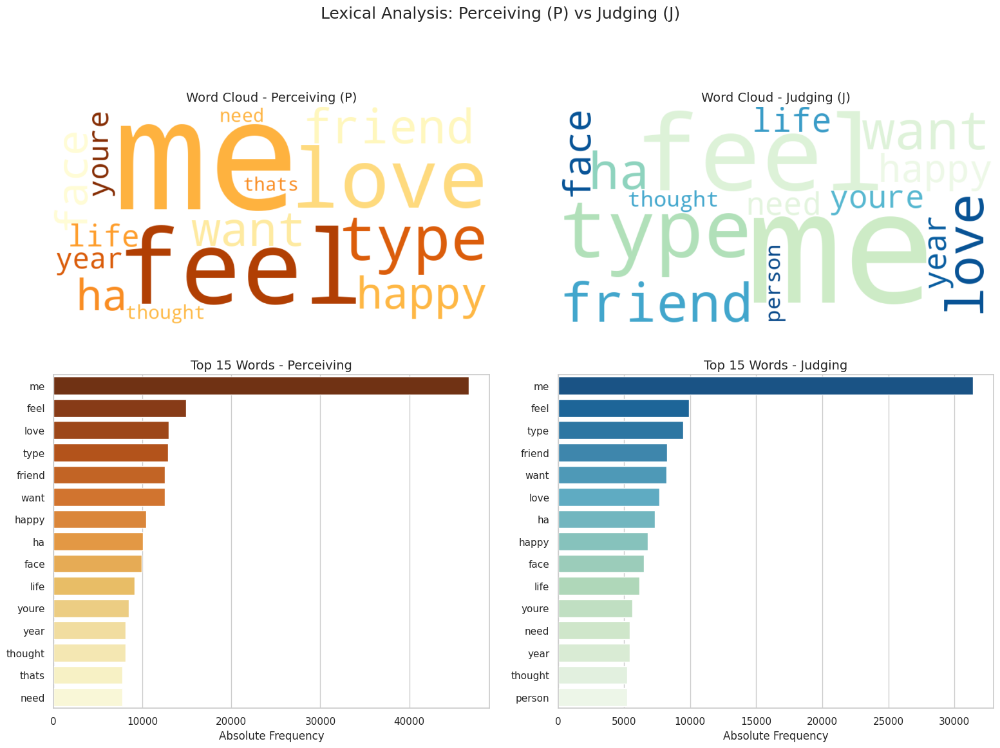

In [ ]:
#Eixo Perceiving vs Judging
perceiving_texts = mbti_df[mbti_df['is_judging'] == 0]['posts_clean']
judging_texts = mbti_df[mbti_df['is_judging'] == 1]['posts_clean']

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words=list(custom_stop_words)).fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

top_words_P = dict(get_top_n_words(perceiving_texts, 15))
top_words_J = dict(get_top_n_words(judging_texts, 15))

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Lexical Analysis: Perceiving (P) vs Judging (J)', fontsize=18)


# Nuvem Perceiving
wc_P = WordCloud(width=800, height=400, background_color='white', colormap='YlOrBr').generate_from_frequencies(top_words_P)
axes[0, 0].imshow(wc_P, interpolation='bilinear')
axes[0, 0].set_title('Word Cloud - Perceiving (P)', fontsize=14)
axes[0, 0].axis('off')

# Nuvem Judging
wc_J = WordCloud(width=800, height=400, background_color='white', colormap='GnBu').generate_from_frequencies(top_words_J)
axes[0, 1].imshow(wc_J, interpolation='bilinear')
axes[0, 1].set_title('Word Cloud - Judging (J)', fontsize=14)
axes[0, 1].axis('off')

# Barras Perceiving
sns.barplot(ax=axes[1, 0], x=list(top_words_P.values()), y=list(top_words_P.keys()), palette='YlOrBr_r')
axes[1, 0].set_title('Top 15 Words - Perceiving', fontsize=14)
axes[1, 0].set_xlabel('Absolute Frequency')

# Barras Judging
sns.barplot(ax=axes[1, 1], x=list(top_words_J.values()), y=list(top_words_J.keys()), palette='GnBu_r')
axes[1, 1].set_title('Top 15 Words - Judging', fontsize=14)
axes[1, 1].set_xlabel('Absolute Frequency')

plt.tight_layout(pad=2.0)
plt.show()

# Personalidades antes da segunda filtragem

In [ ]:
mbti_types = [
    'ISTJ', 'ISFJ', 'INFJ', 'INTJ',
    'ISTP', 'ISFP', 'INFP', 'INTP',
    'ESTP', 'ESFP', 'ENFP', 'ENTP',
    'ESTJ', 'ESFJ', 'ENFJ', 'ENTJ'
]

# Cada personalidade recebe uma família de cores
mbti_colors = {
    'ISTJ': 'Blues',
    'ISFJ': 'Greens',
    'INFJ': 'Purples',
    'INTJ': 'Greys',

    'ISTP': 'Oranges',
    'ISFP': 'Reds',
    'INFP': 'RdPu',
    'INTP': 'BuPu',

    'ESTP': 'YlGn',
    'ESFP': 'YlOrBr',
    'ENFP': 'PuRd',
    'ENTP': 'PuBu',

    'ESTJ': 'GnBu',
    'ESFJ': 'OrRd',
    'ENFJ': 'YlGnBu',
    'ENTJ': 'PuBuGn'
}

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


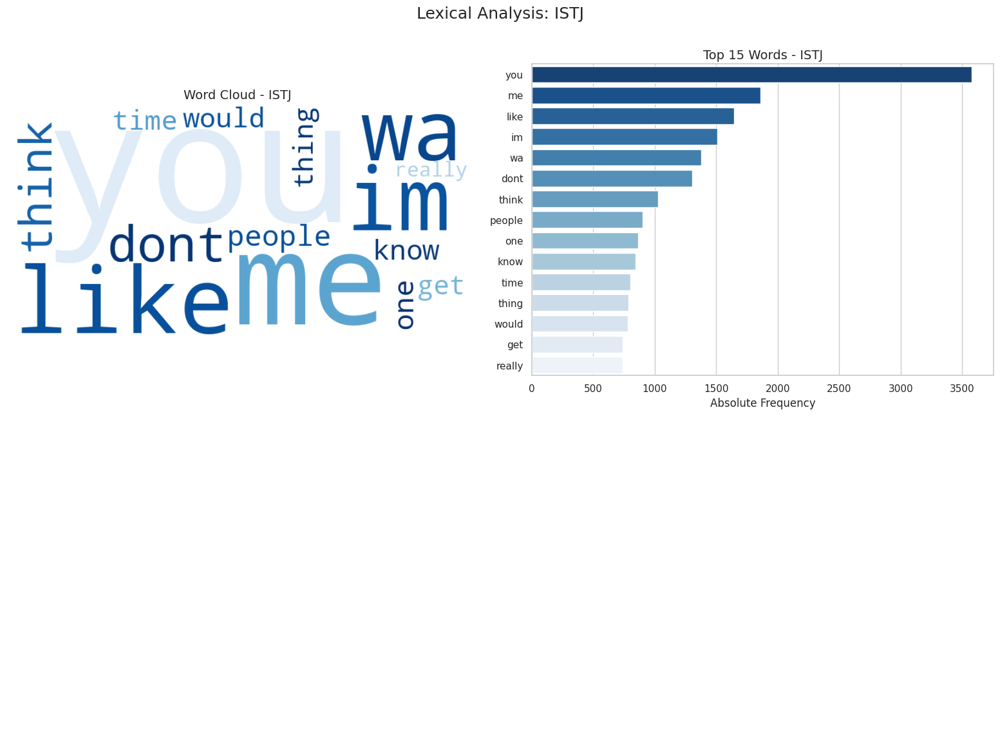

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


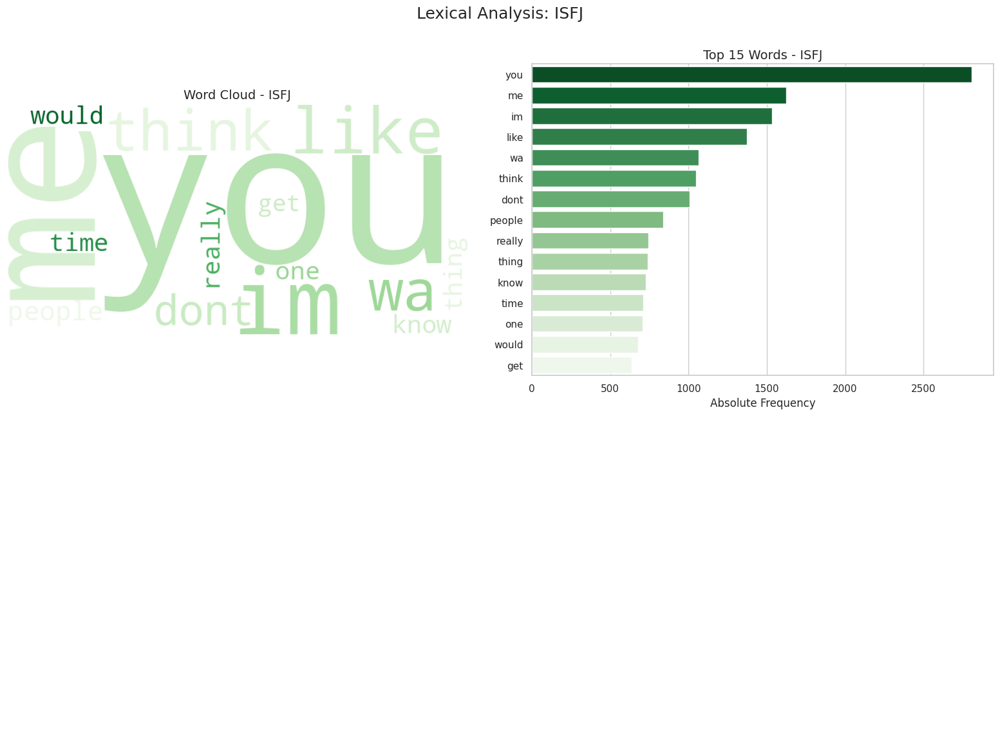

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


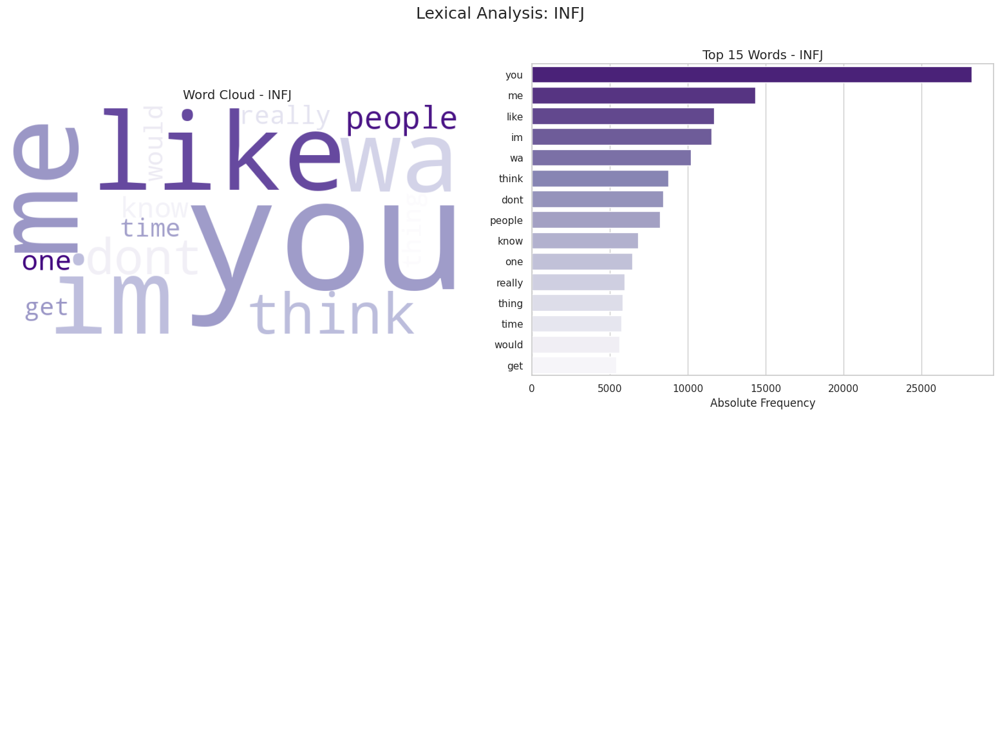

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


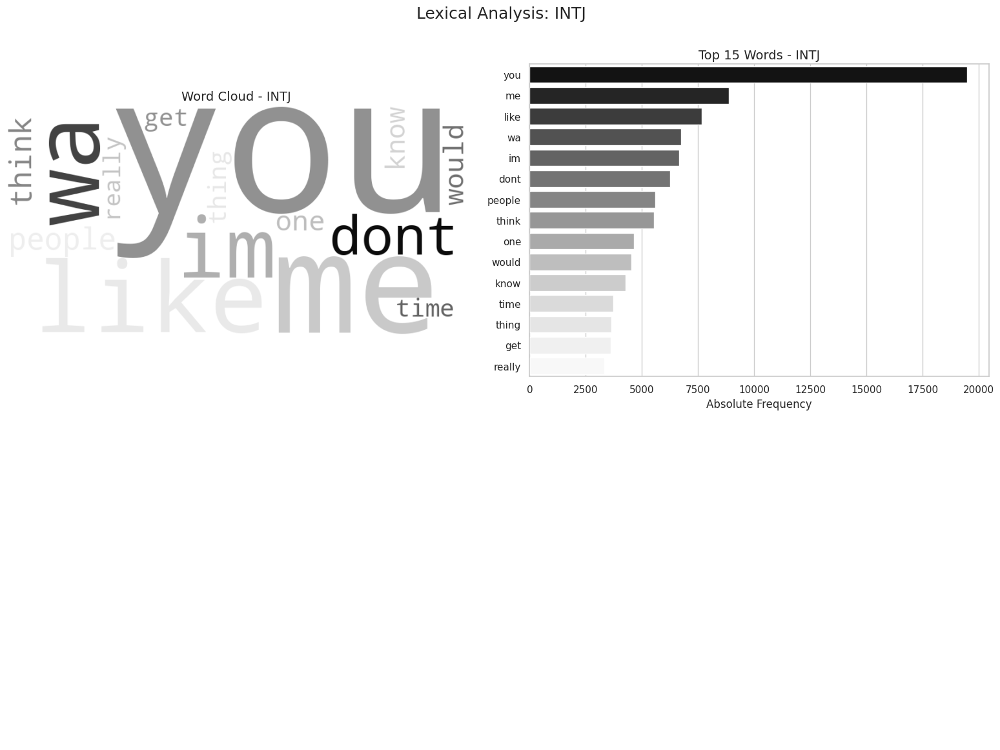

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


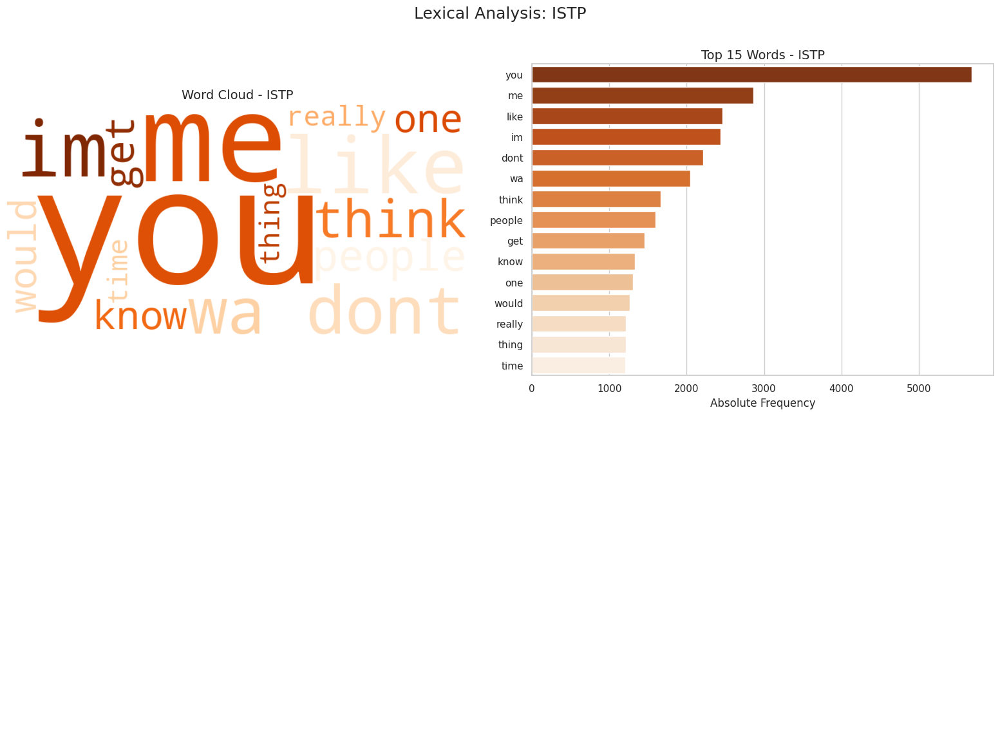

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


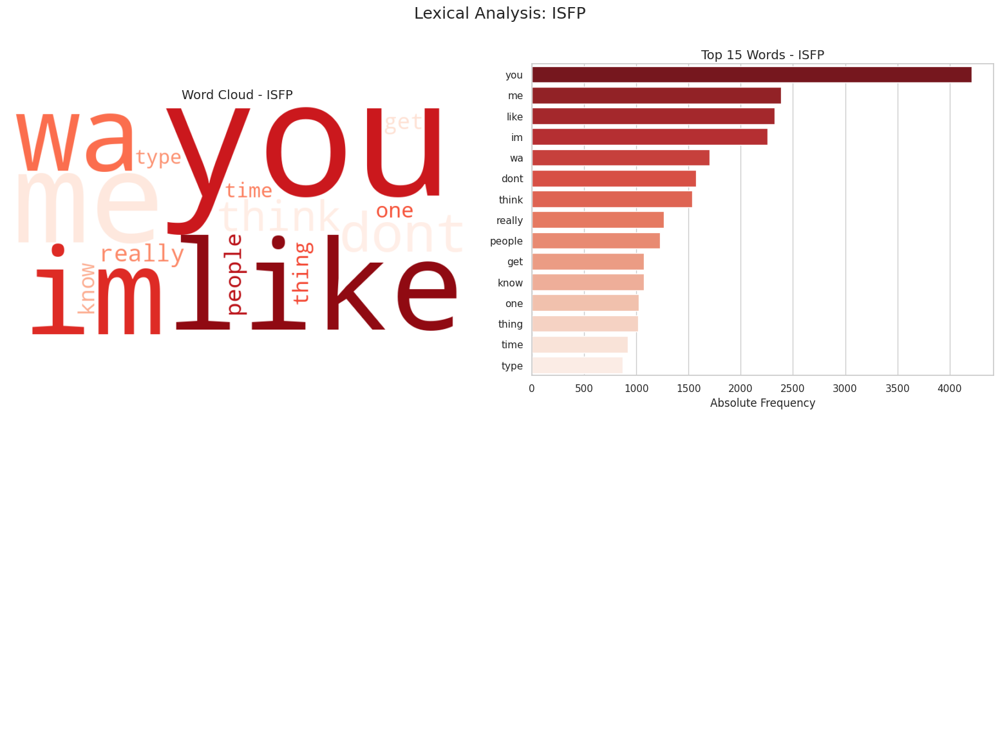

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


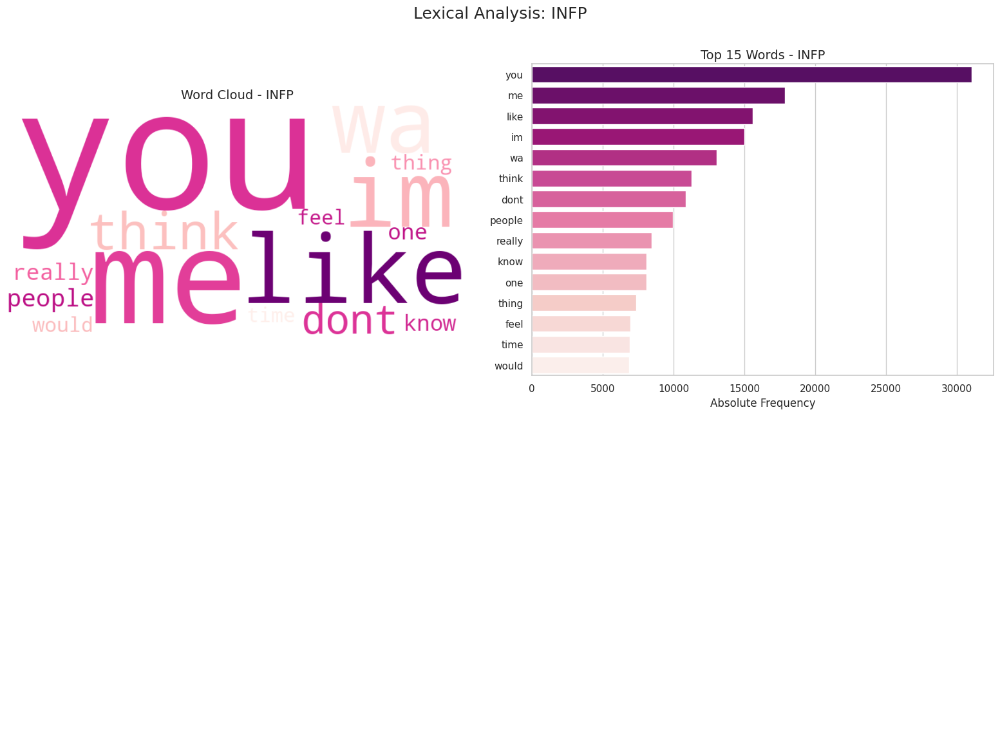

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


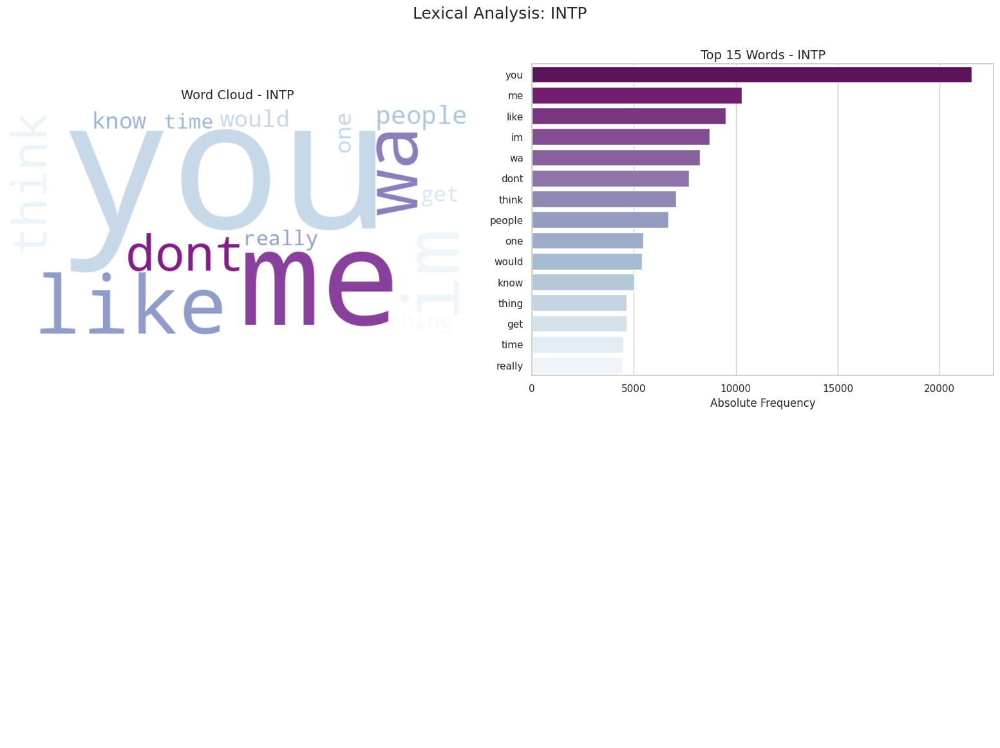

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


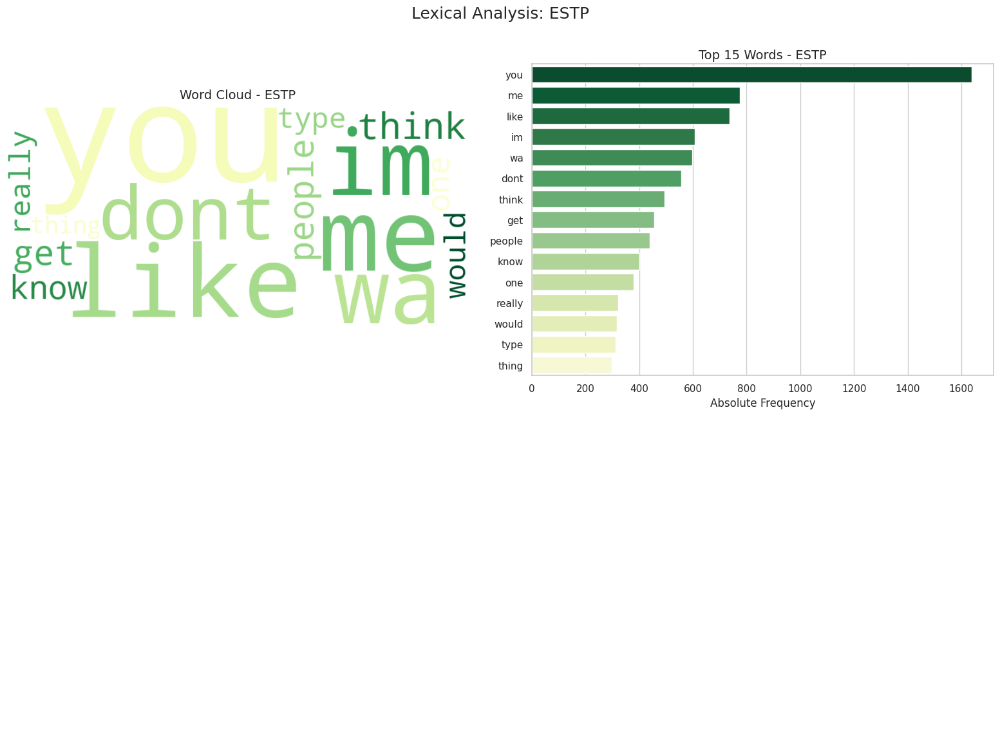

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


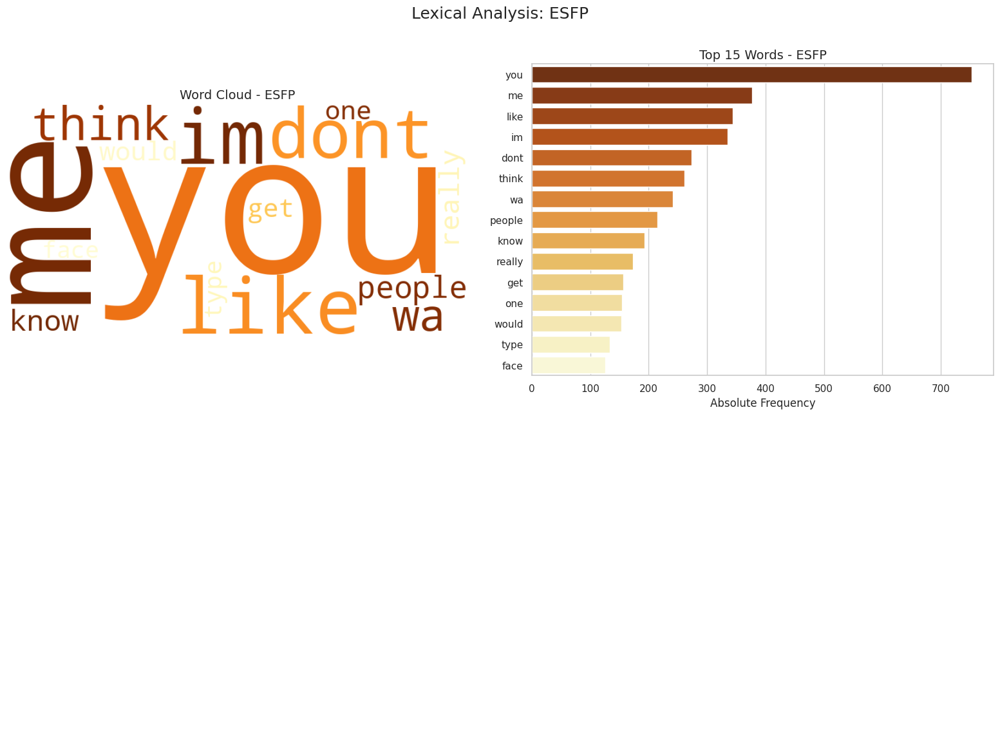

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


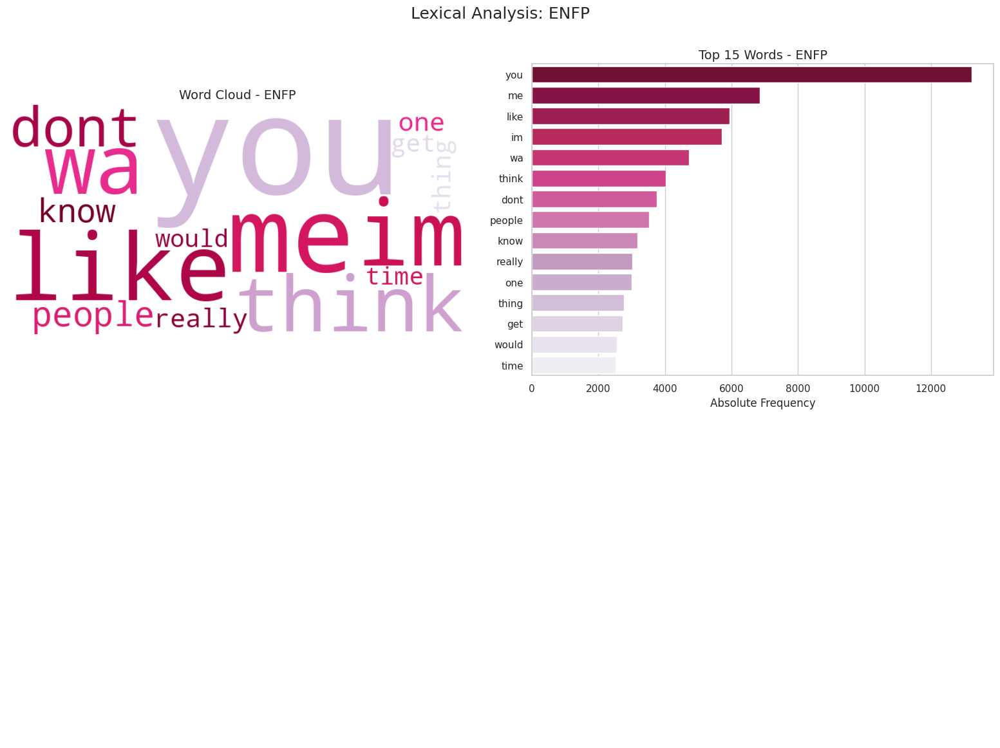

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


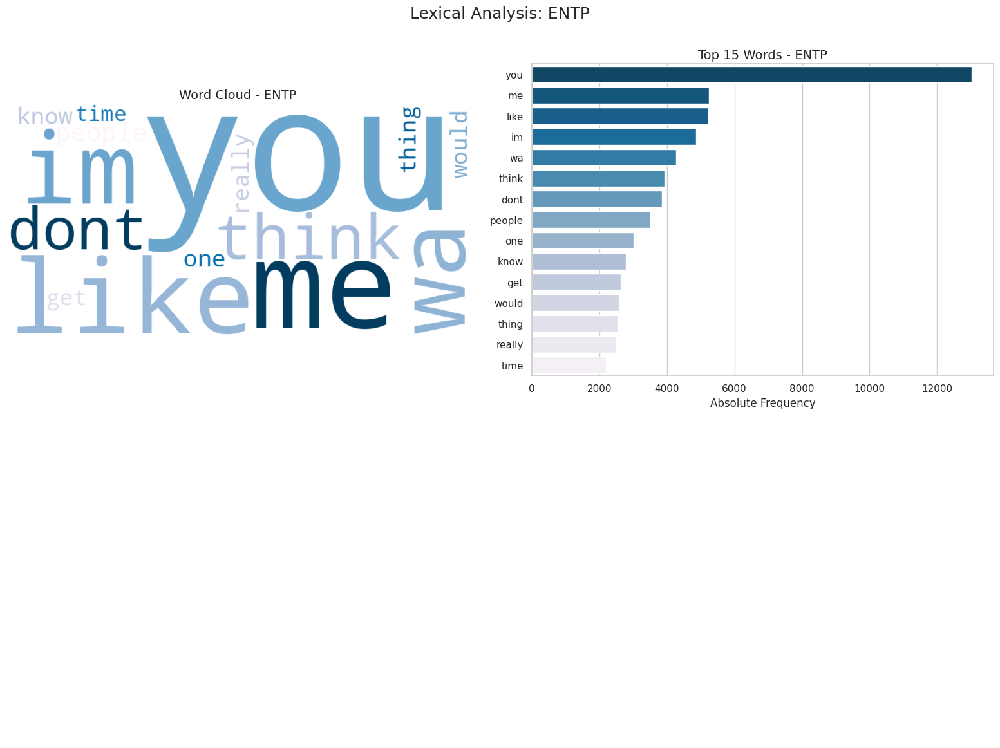

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


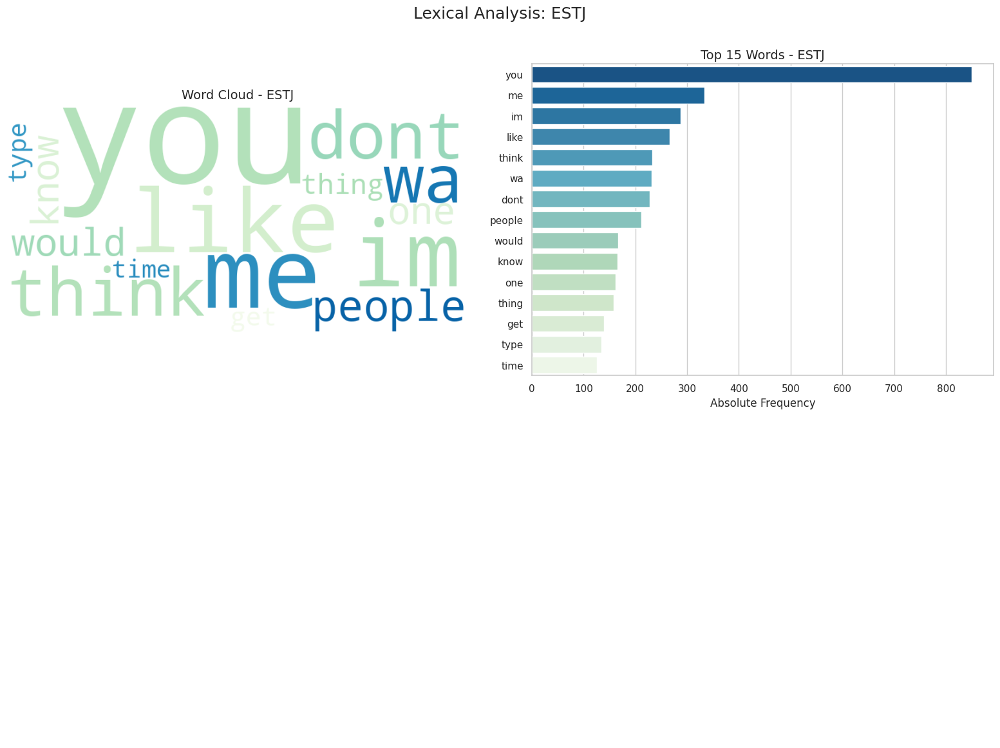

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


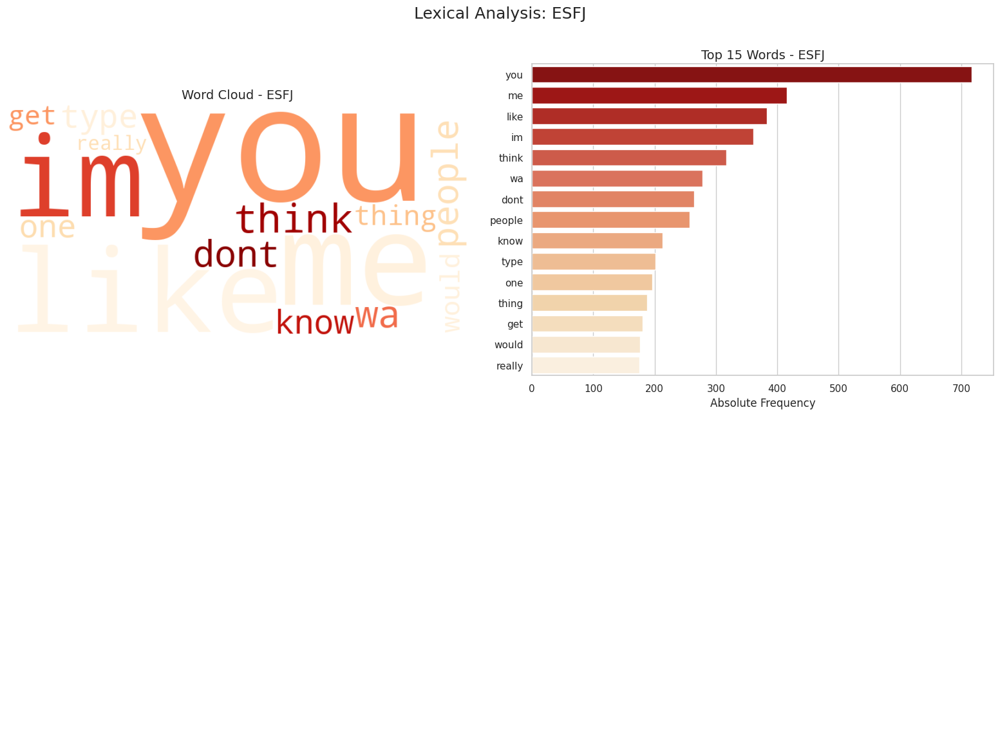

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


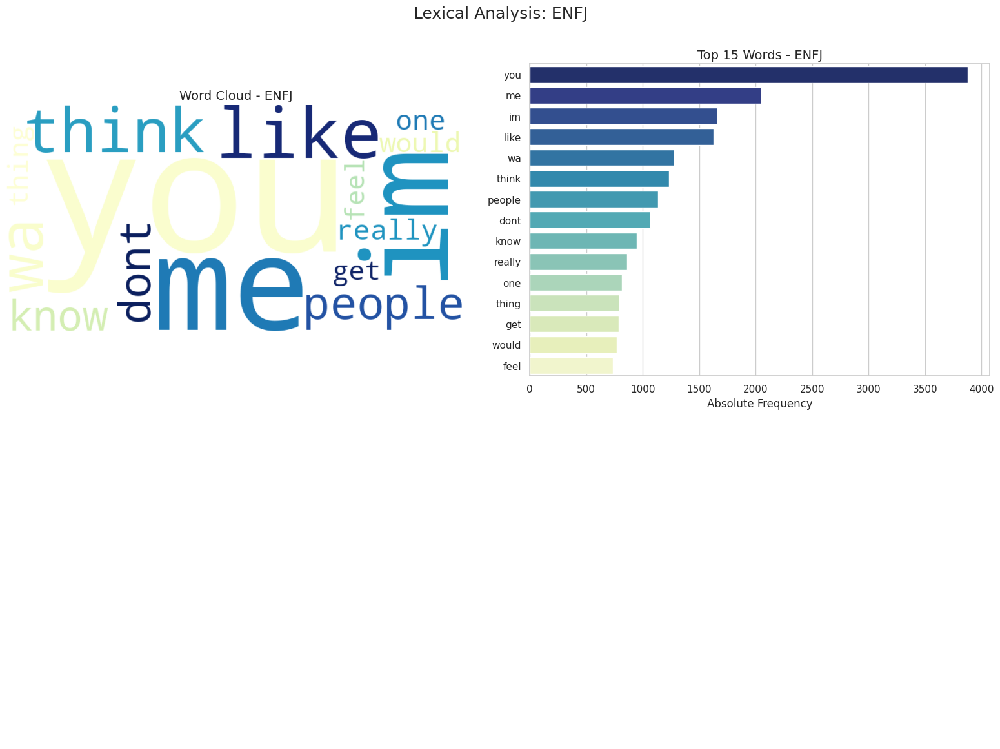

/tmp/ipykernel_774/3979496690.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


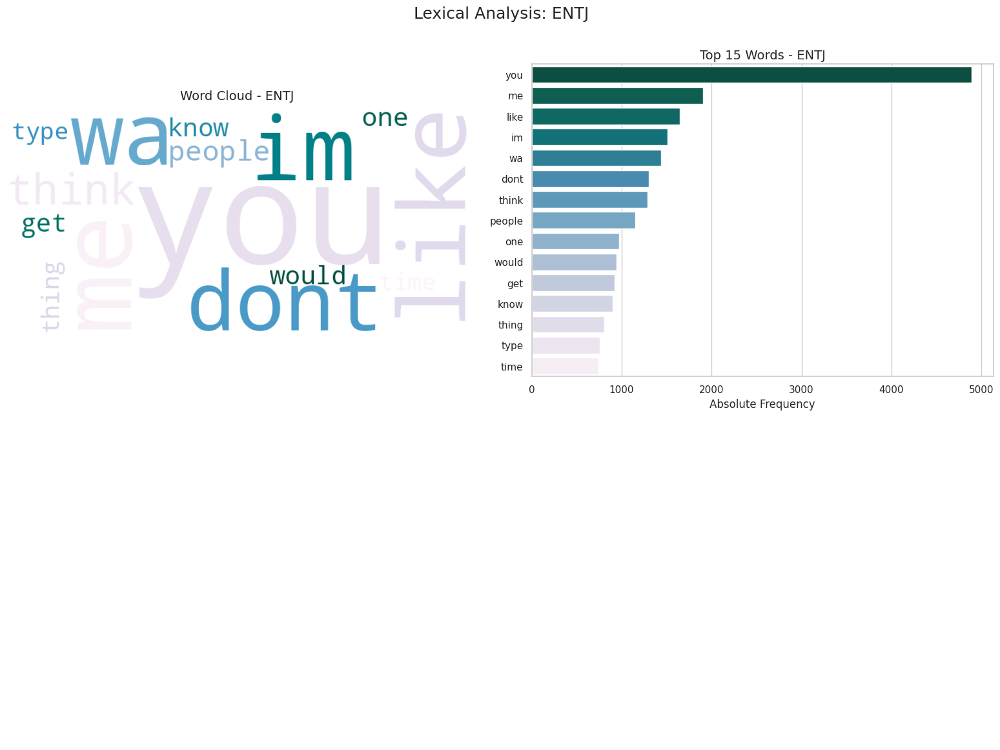

In [ ]:
def get_top_n_words(corpus, n=15):
  vec = CountVectorizer().fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

for mbti_type in mbti_types:
  personality_texts = mbti_df[
      mbti_df['type'] == mbti_type
  ] ['posts_clean']

  top_words = dict(get_top_n_words(personality_texts, 15))

  personality_color = mbti_colors[mbti_type]

  fig, axes = plt.subplots(2, 2, figsize=(16, 12))
  fig.suptitle(f'Lexical Analysis: {mbti_type}', fontsize=18)

  # Nuvem Das Personalidades
  wc = WordCloud(width=800, height=400, background_color='white', colormap=personality_color).generate_from_frequencies(top_words)
  axes[0, 0].imshow(wc, interpolation='bilinear')
  axes[0, 0].set_title(f'Word Cloud - {mbti_type}', fontsize=14)
  axes[0, 0].axis('off')

  # Barras Das Personalidades
  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')
  axes[0, 1].set_title(f'Top 15 Words - {mbti_type}', fontsize=14)
  axes[0, 1].set_xlabel('Absolute Frequency')

  axes[1, 0].axis('off')
  axes[1, 1].axis('off')

  plt.tight_layout(pad=2.0)
  plt.show()

# Personalidades removendo apenas stop words

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


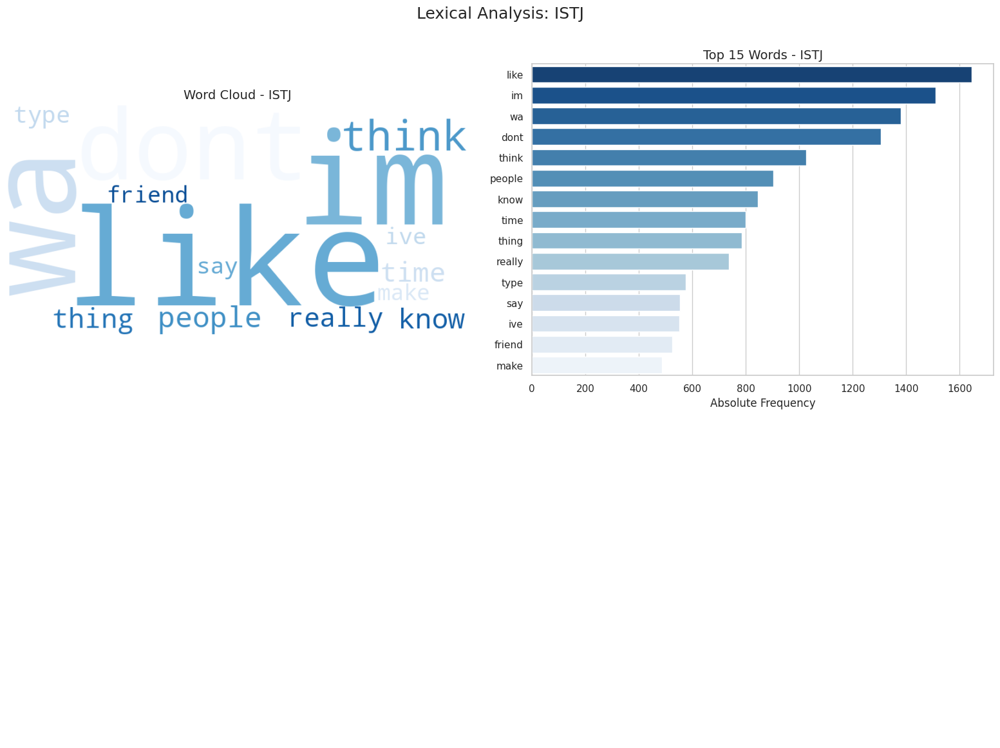

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


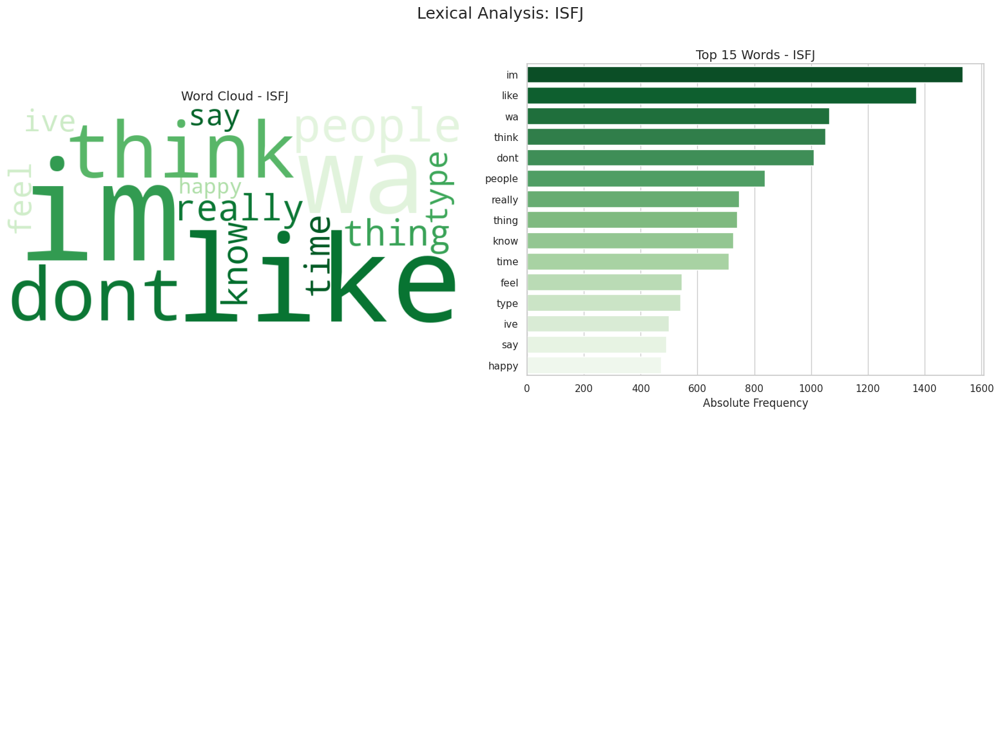

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


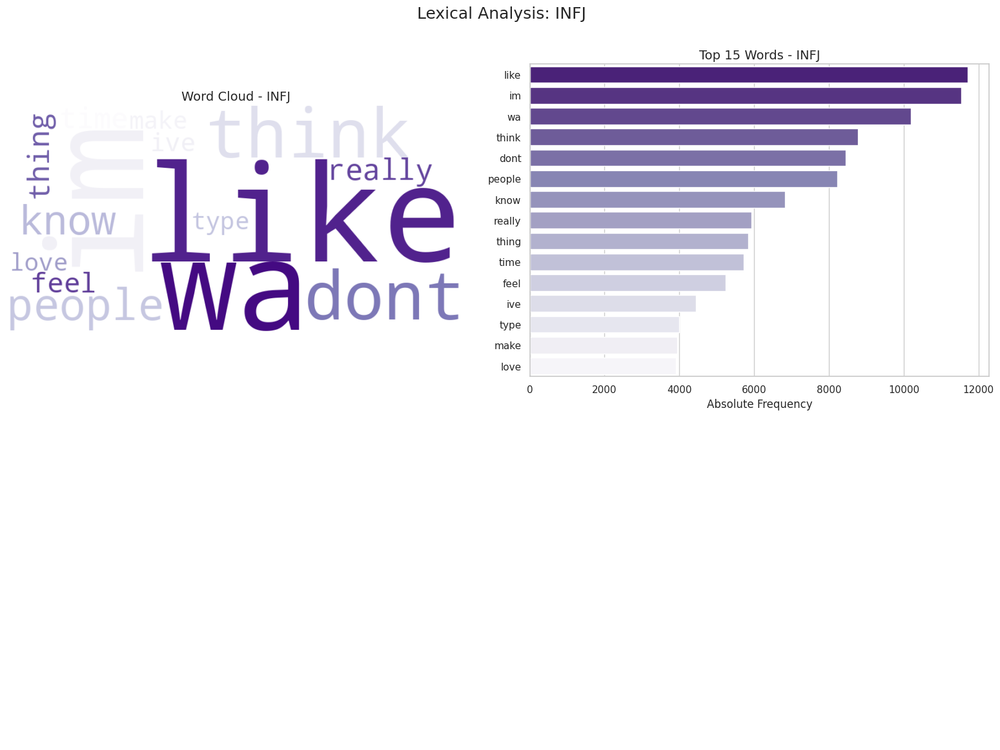

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


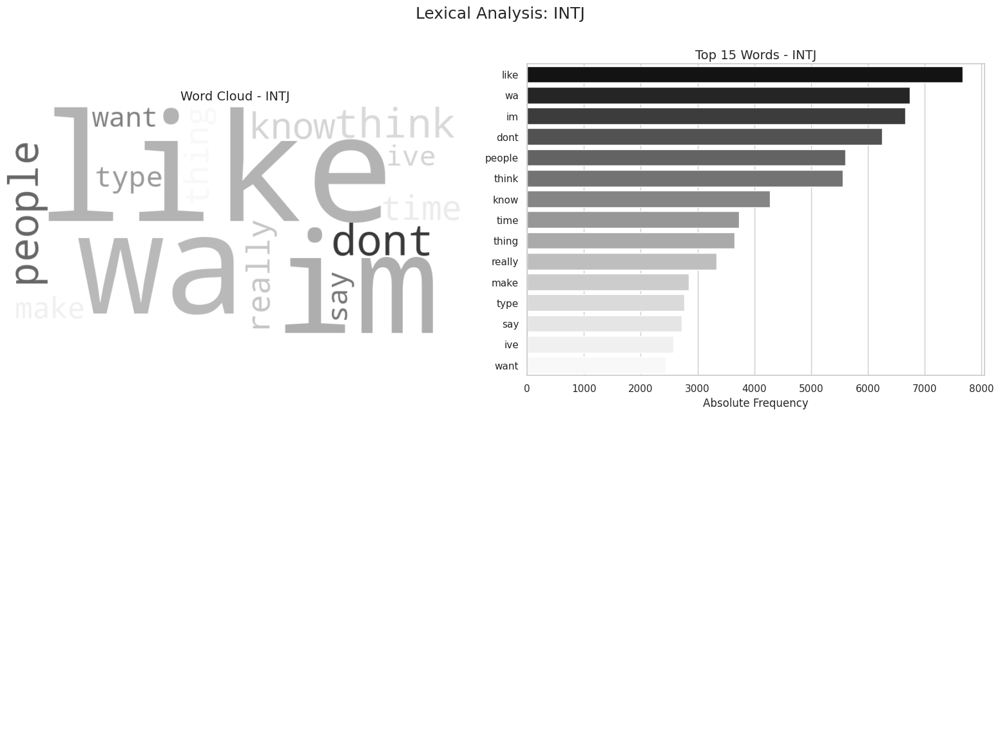

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


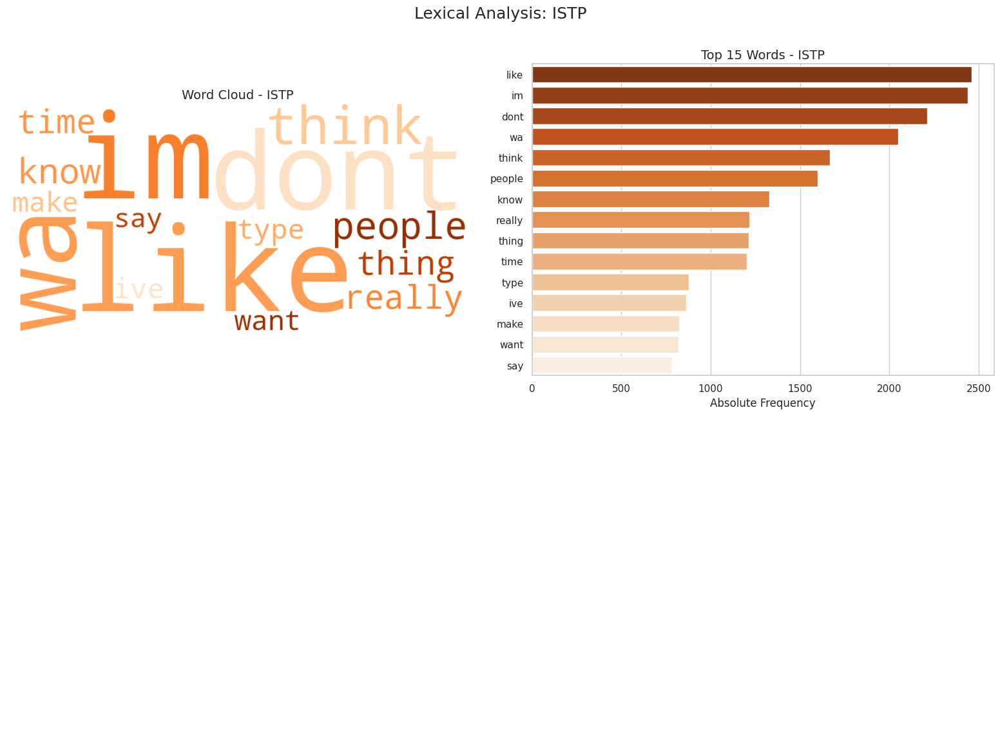

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


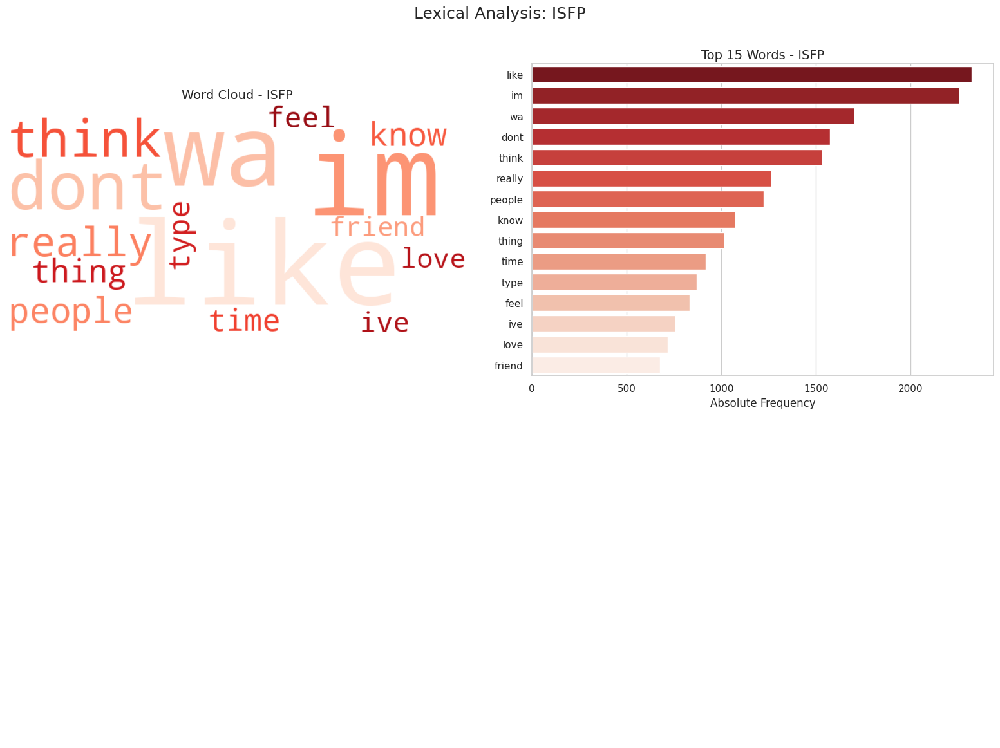

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


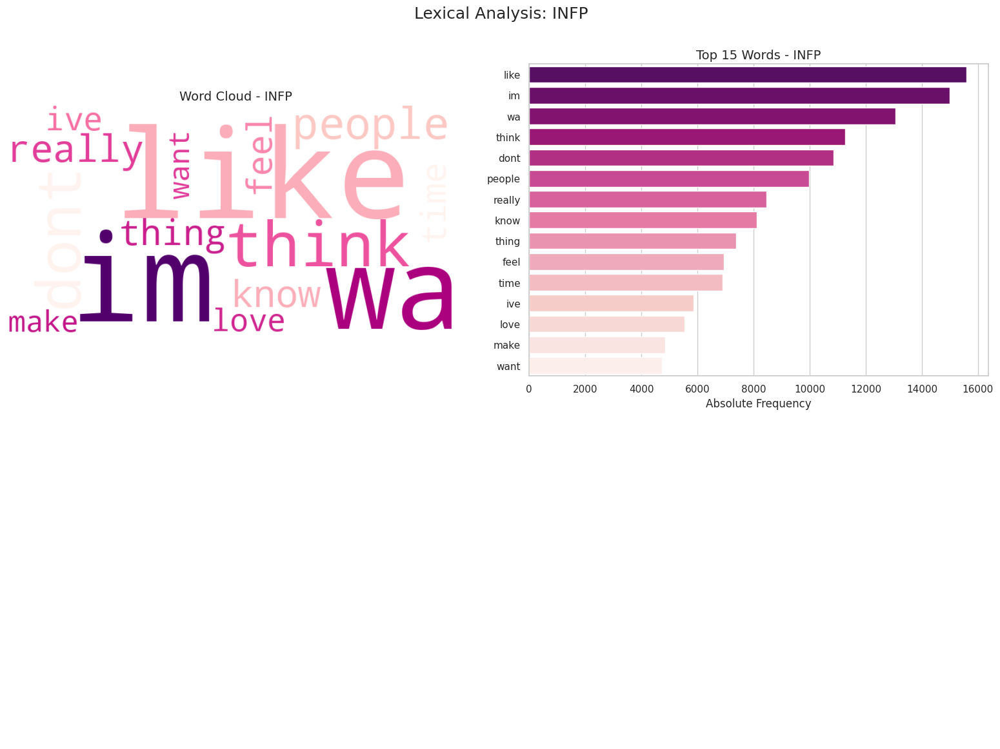

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


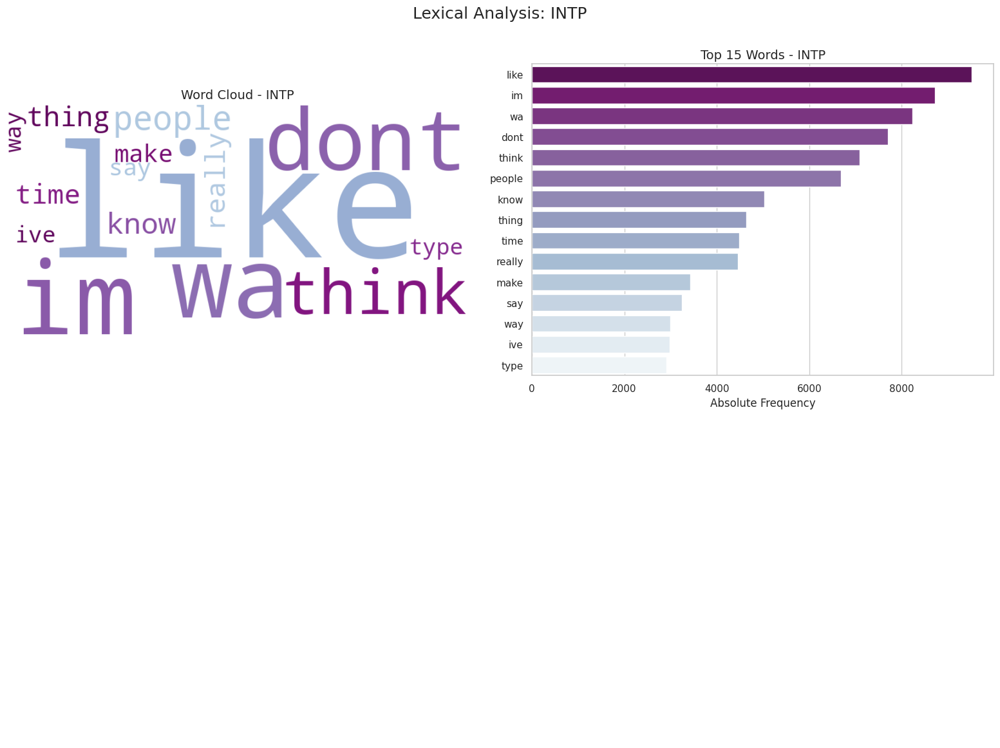

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


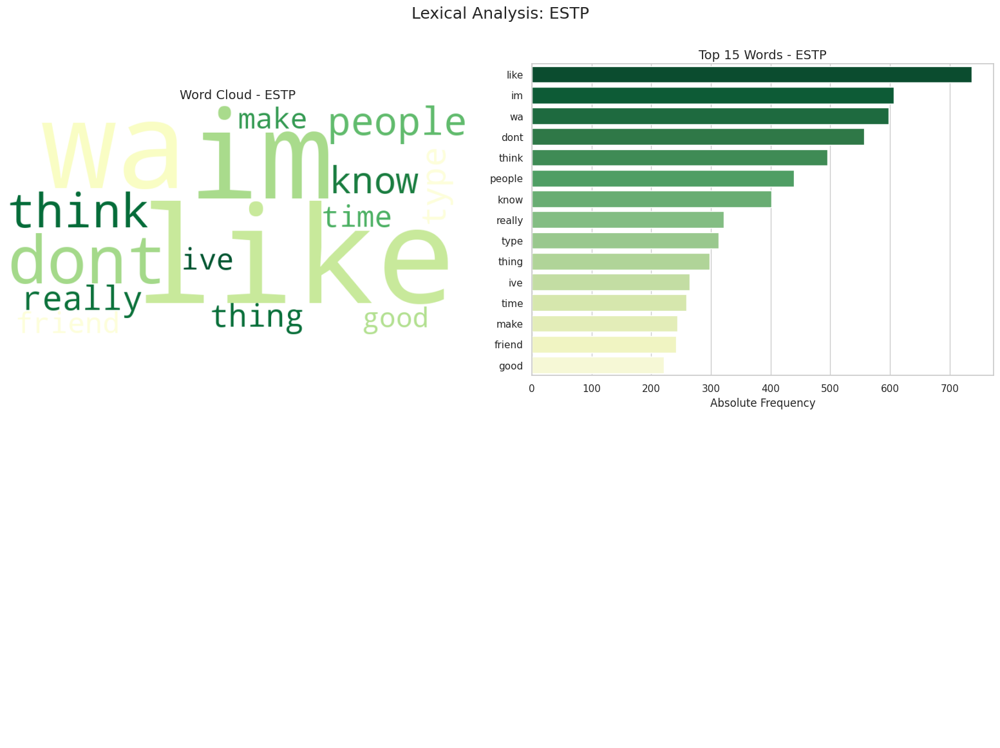

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


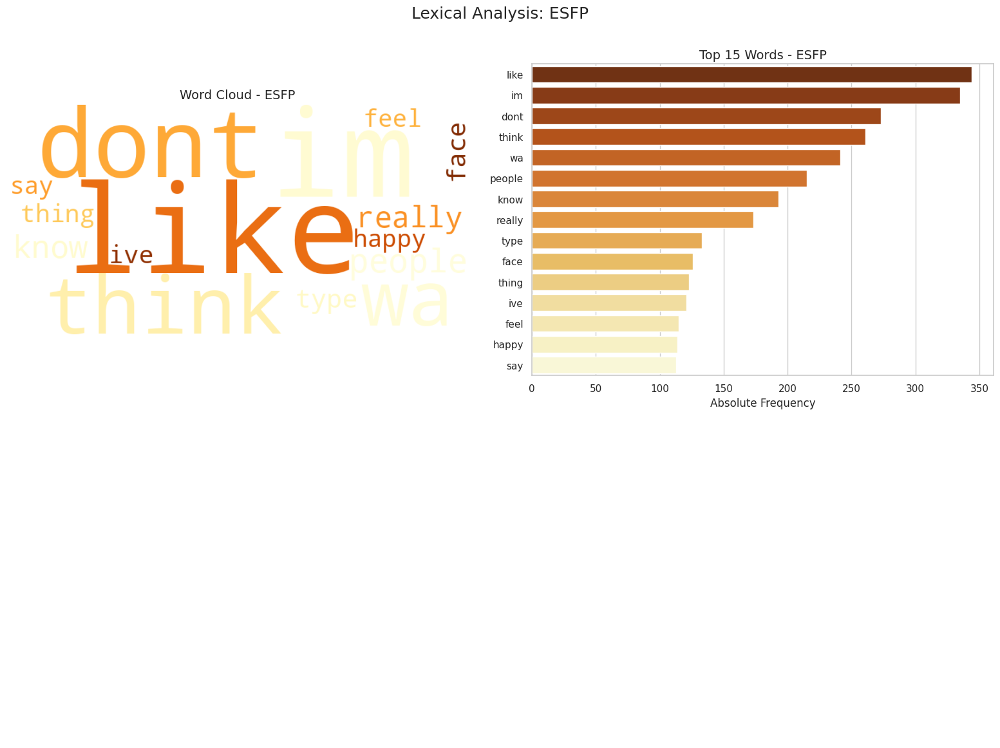

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


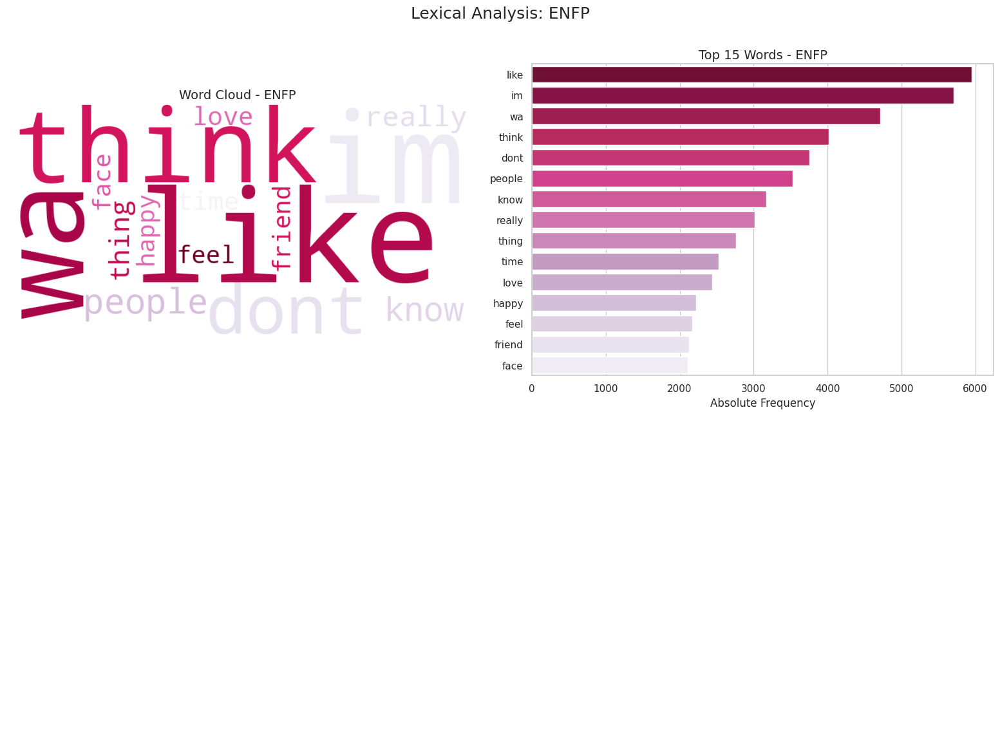

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


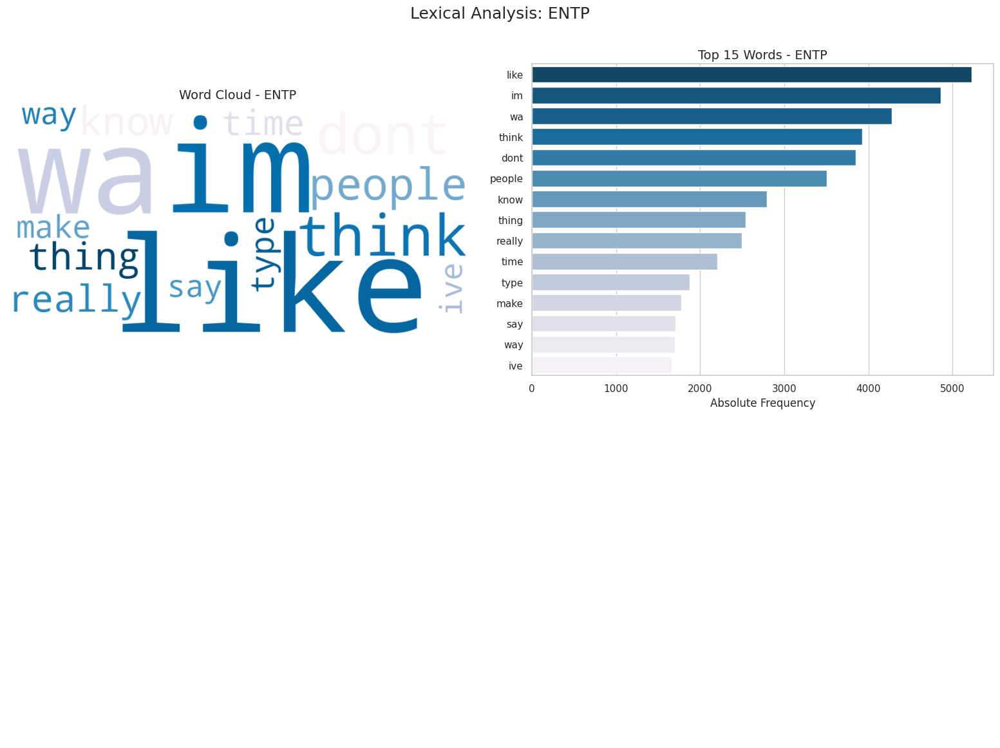

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


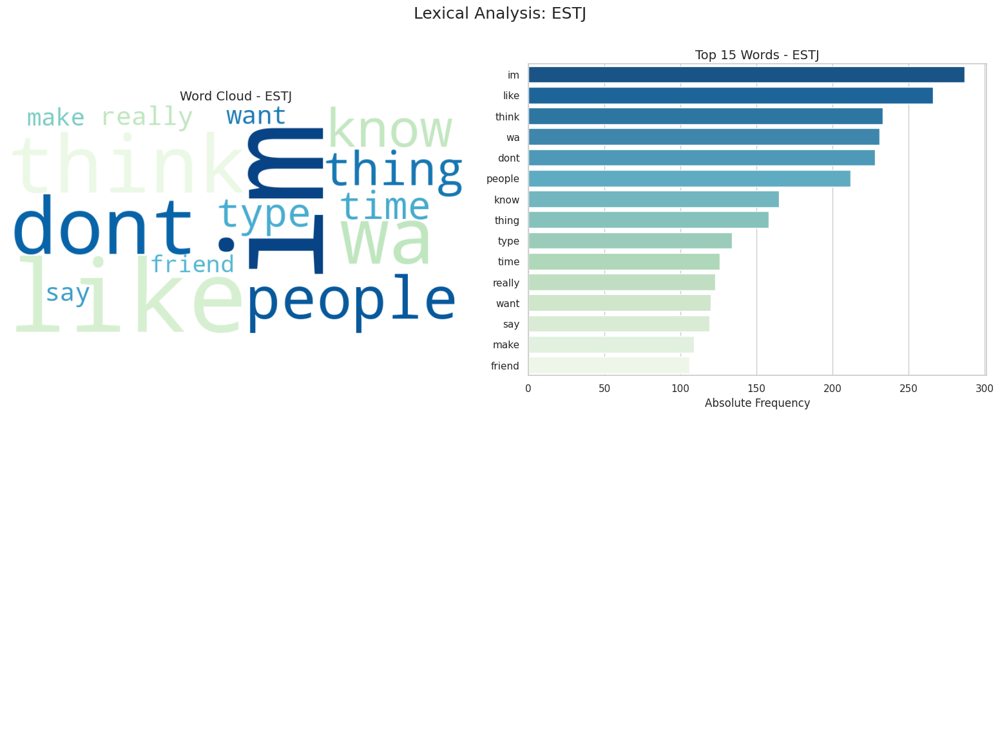

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


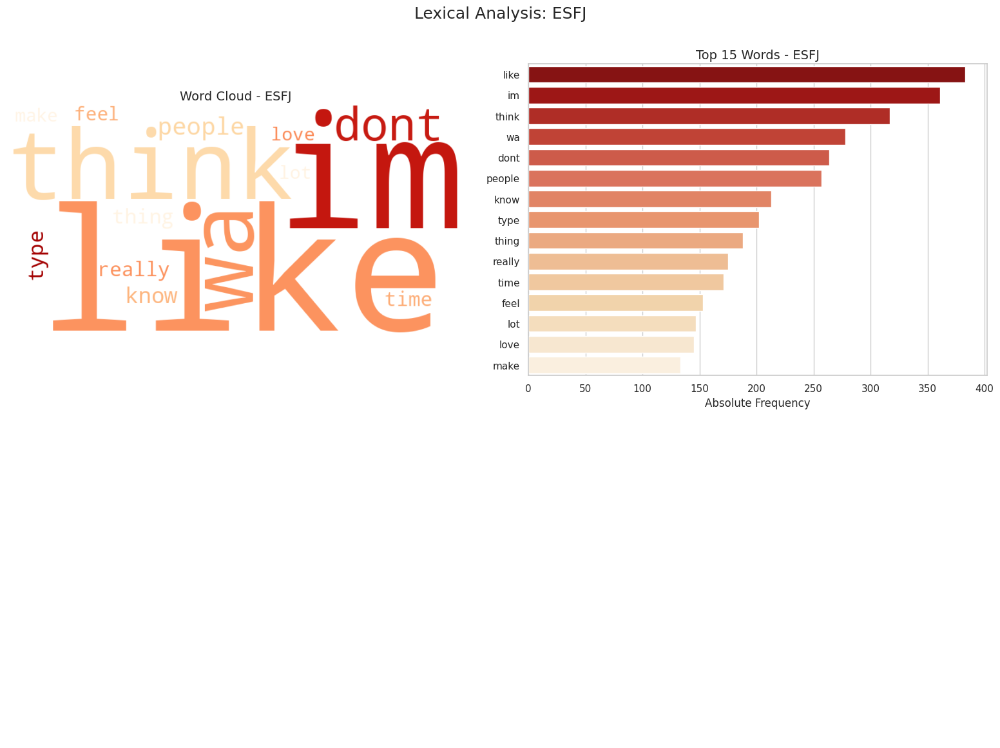

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


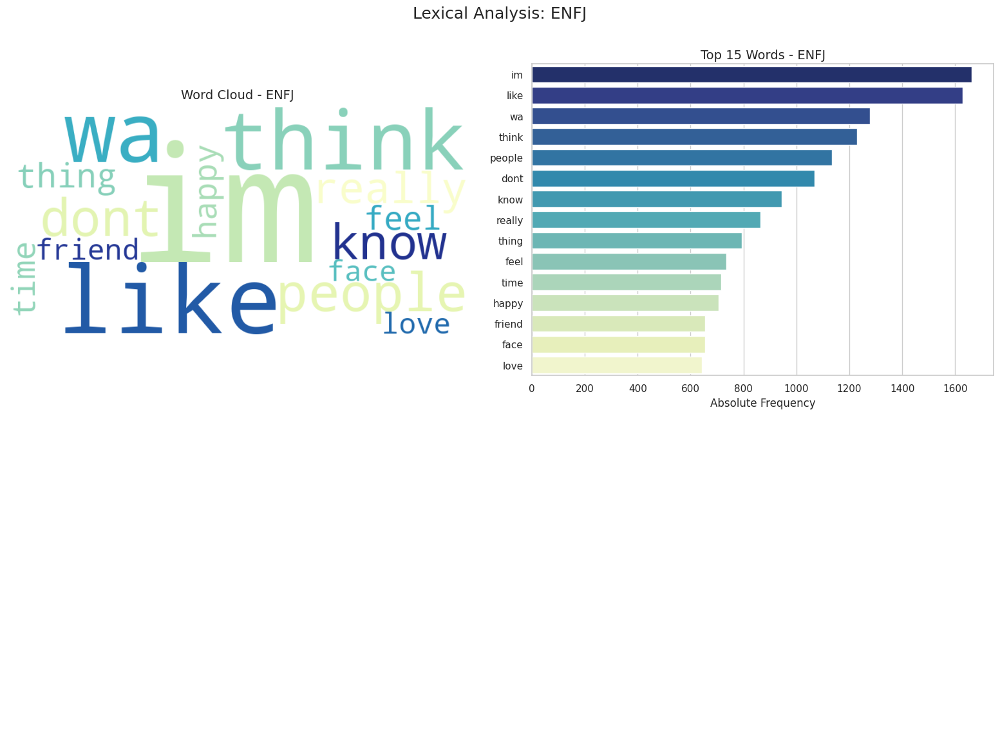

/tmp/ipykernel_774/4122721579.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


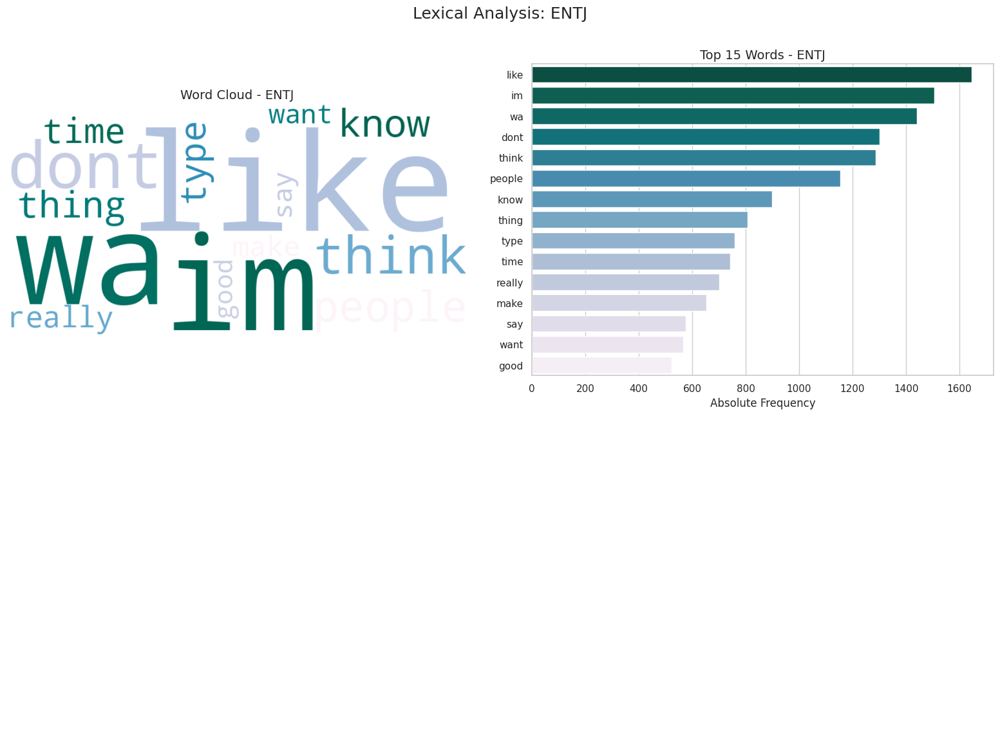

In [ ]:
def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words='english').fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

for mbti_type in mbti_types:
  personality_texts = mbti_df[
      mbti_df['type'] == mbti_type
  ] ['posts_clean']

  top_words = dict(get_top_n_words(personality_texts, 15))

  personality_color = mbti_colors[mbti_type]

  fig, axes = plt.subplots(2, 2, figsize=(16, 12))
  fig.suptitle(f'Lexical Analysis: {mbti_type}', fontsize=18)

  # Nuvem Das Personalidades
  wc = WordCloud(width=800, height=400, background_color='white', colormap=personality_color).generate_from_frequencies(top_words)
  axes[0, 0].imshow(wc, interpolation='bilinear')
  axes[0, 0].set_title(f'Word Cloud - {mbti_type}', fontsize=14)
  axes[0, 0].axis('off')

  # Barras Das Personalidades
  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')
  axes[0, 1].set_title(f'Top 15 Words - {mbti_type}', fontsize=14)
  axes[0, 1].set_xlabel('Absolute Frequency')

  axes[1, 0].axis('off')
  axes[1, 1].axis('off')

  plt.tight_layout(pad=2.0)
  plt.show()

# Personalidades removendo stop words customizadas

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


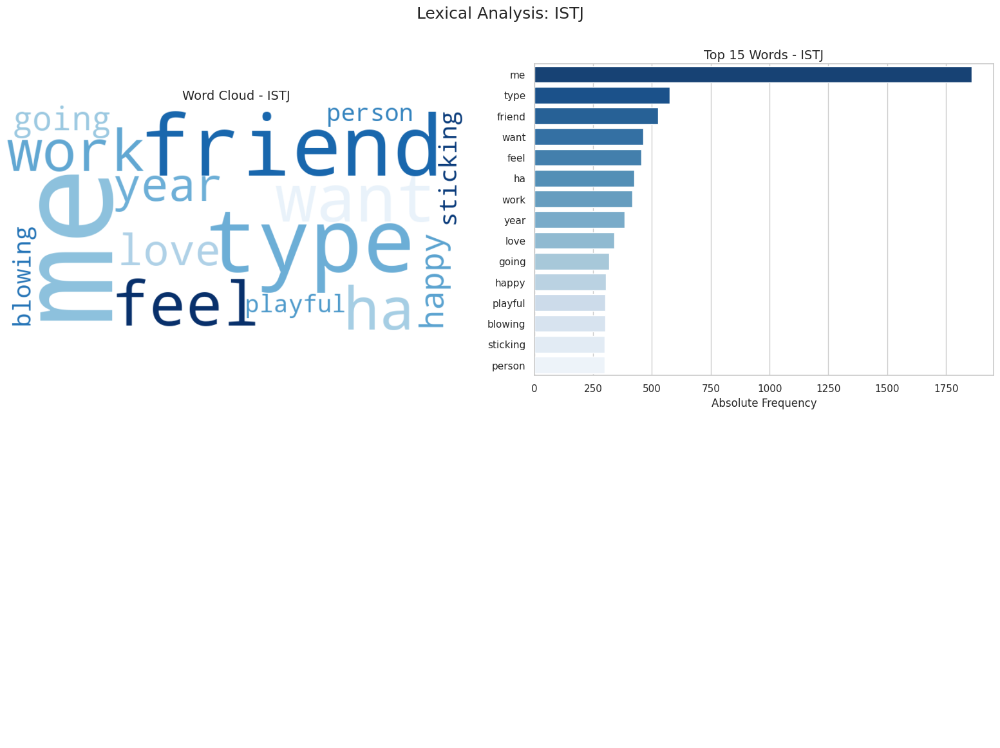

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


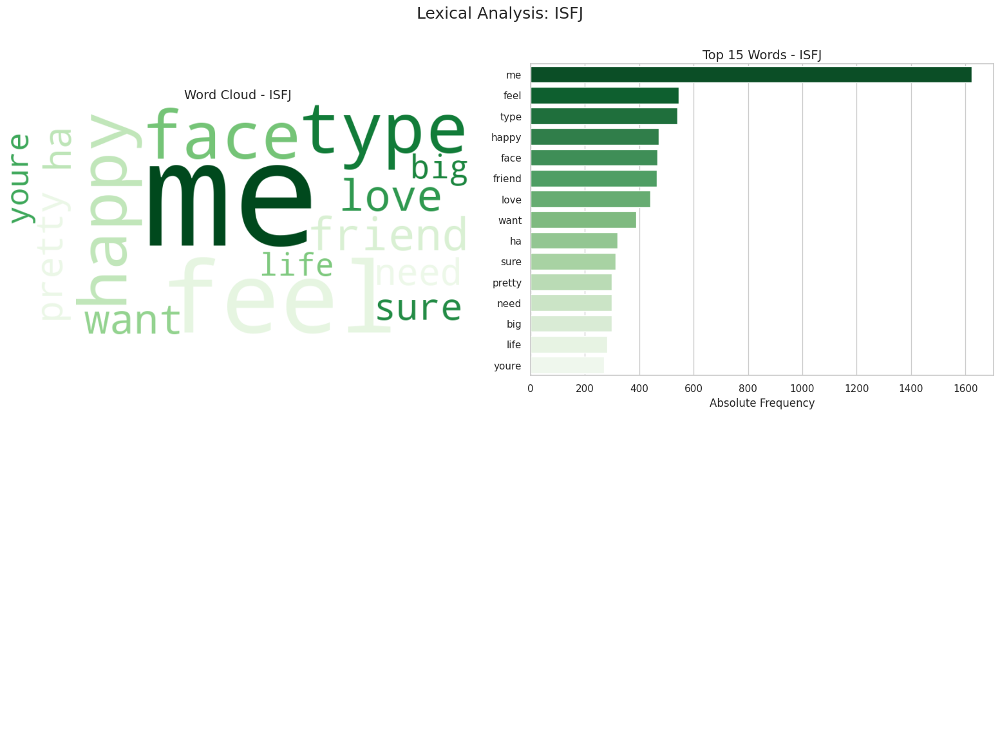

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


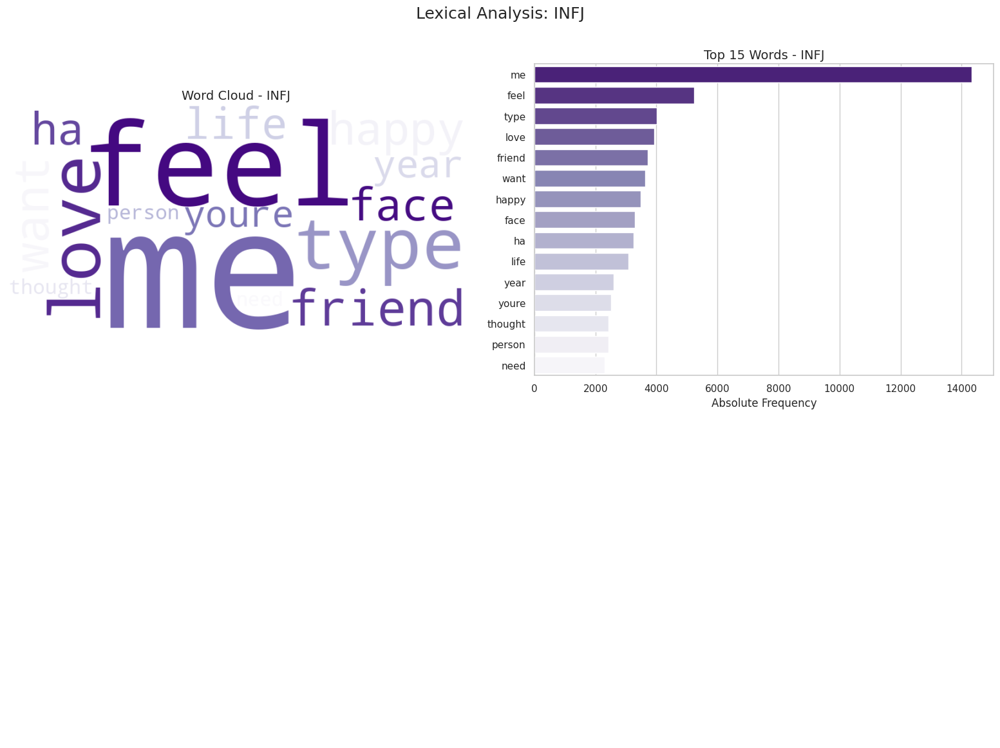

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


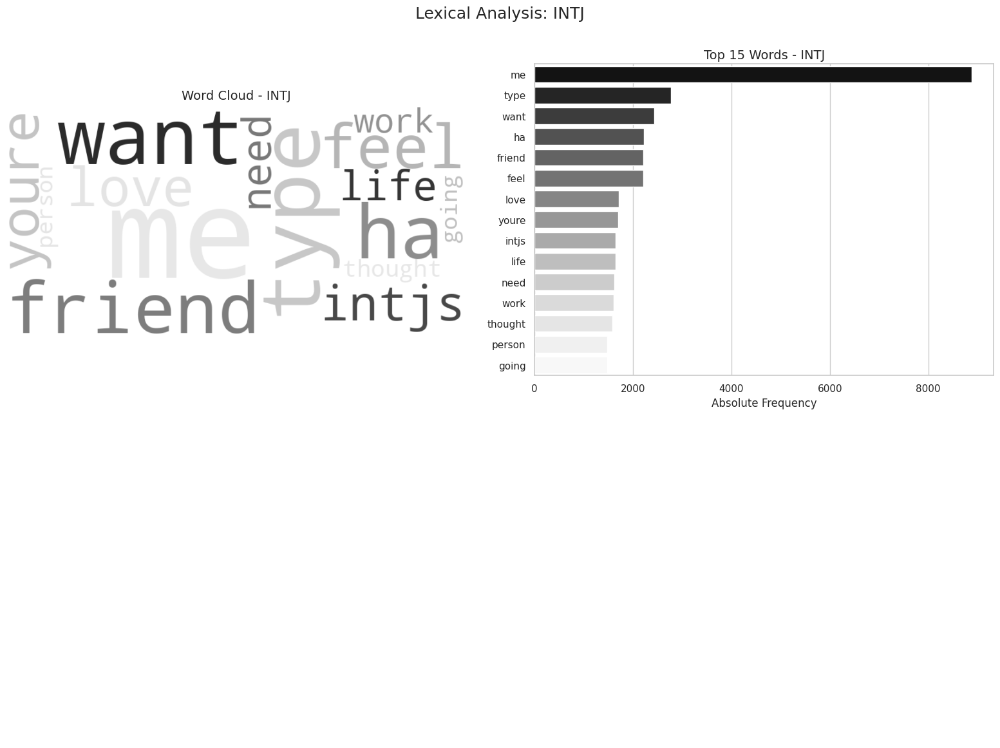

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


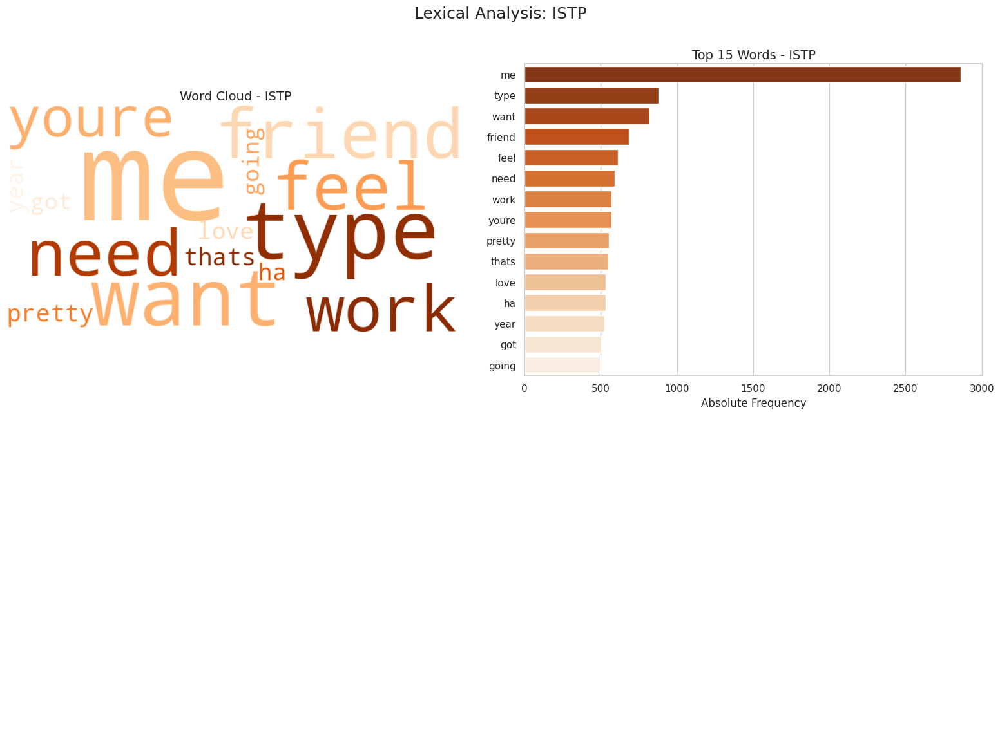

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


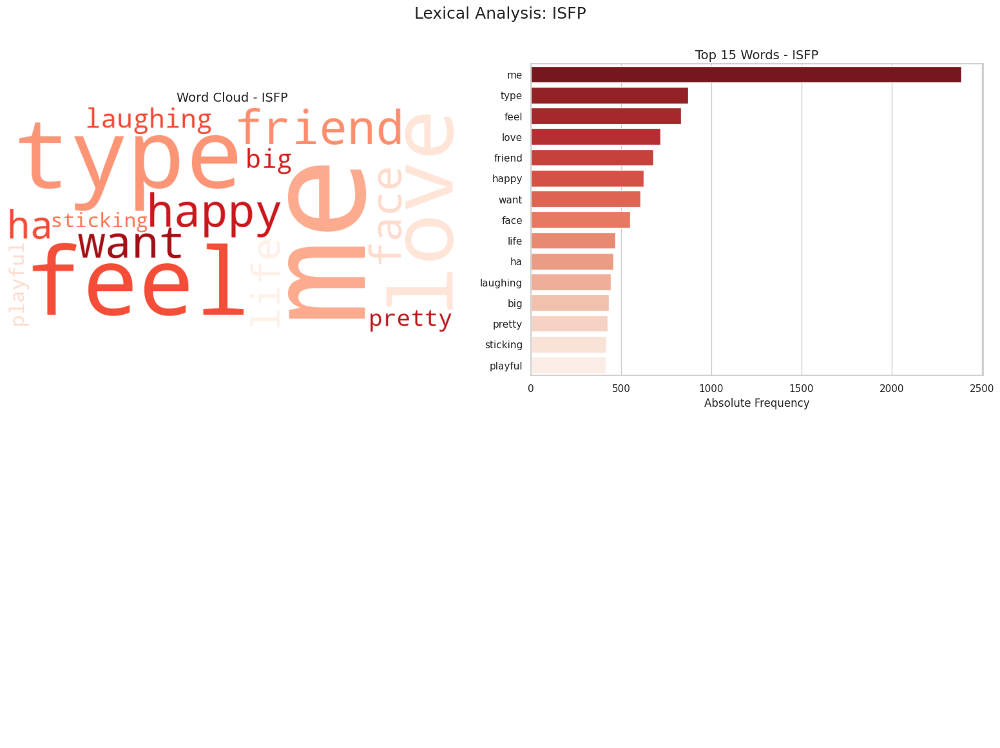

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


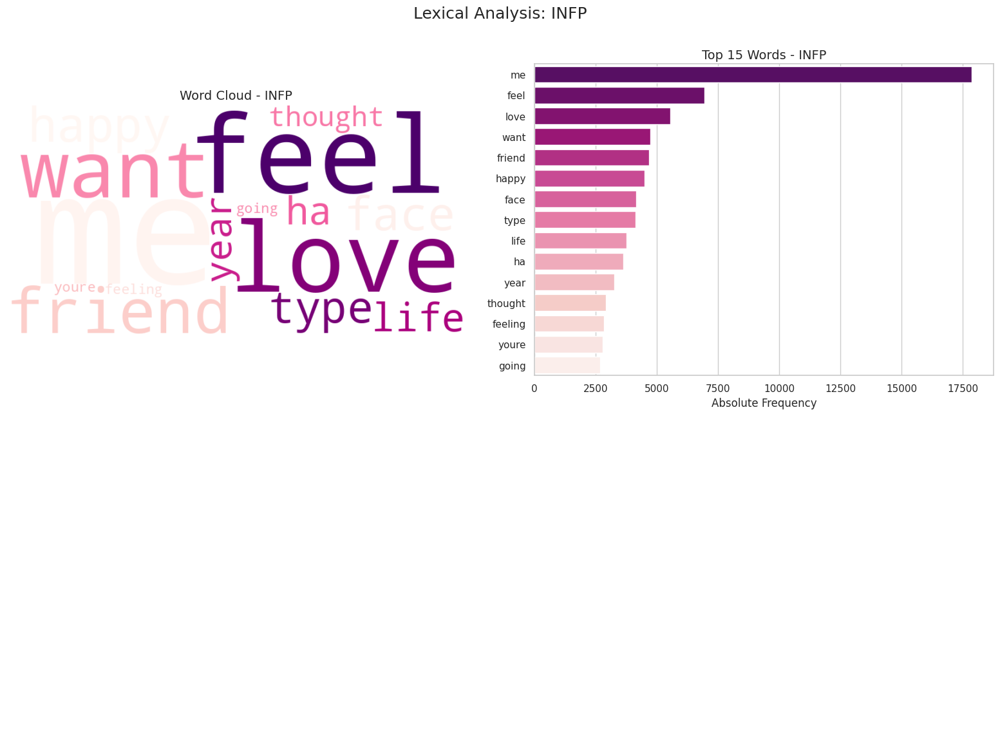

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


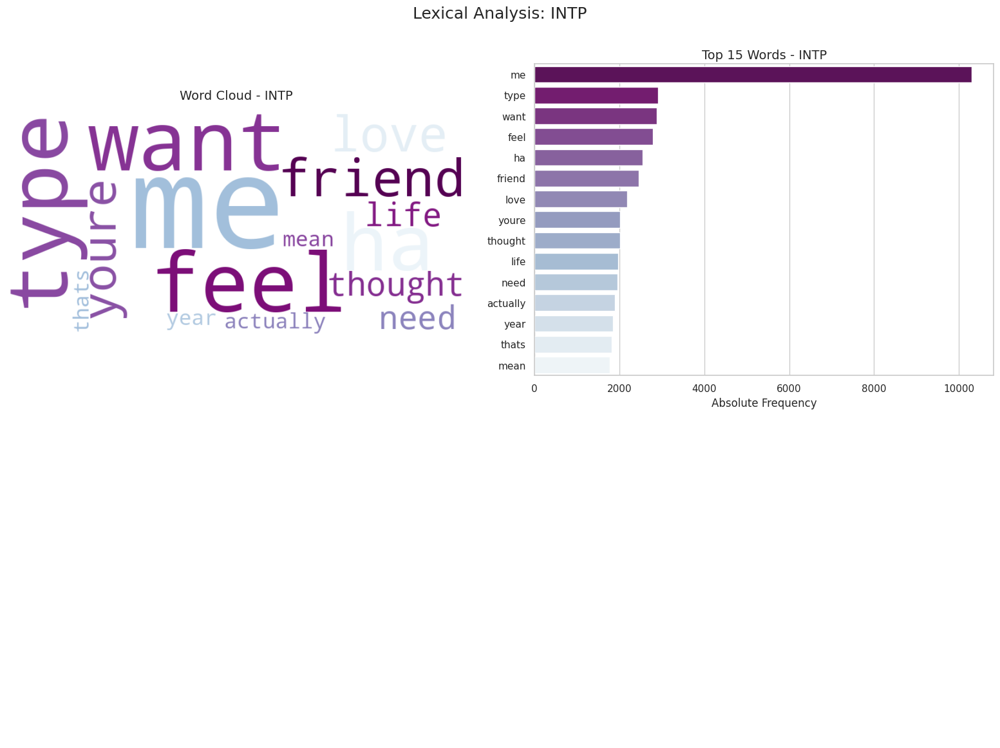

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


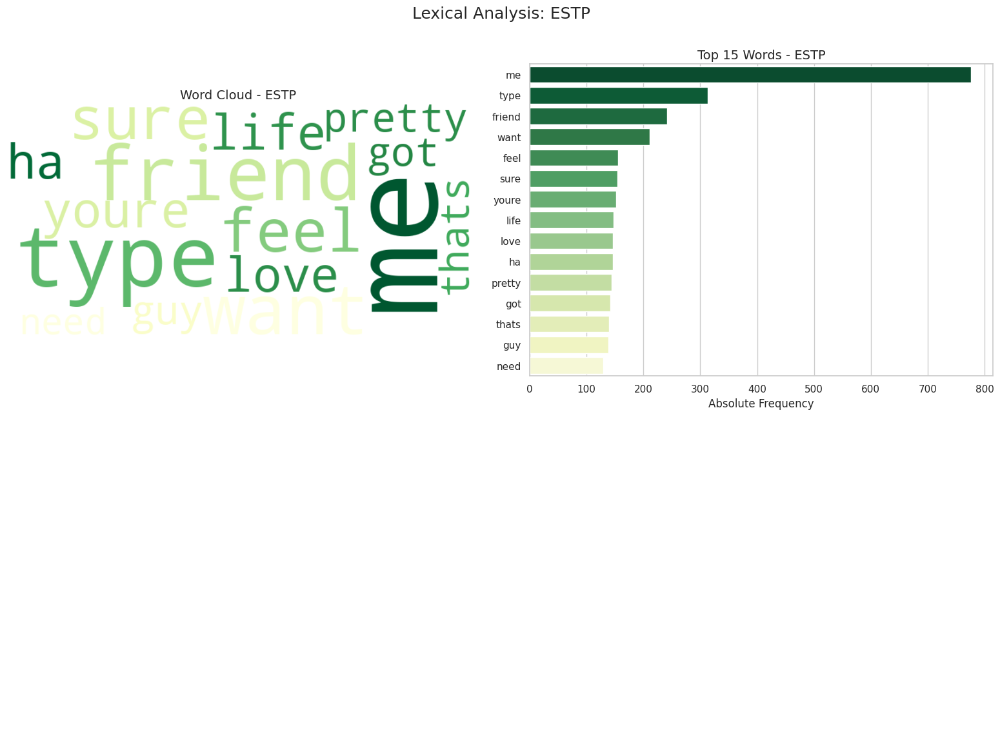

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


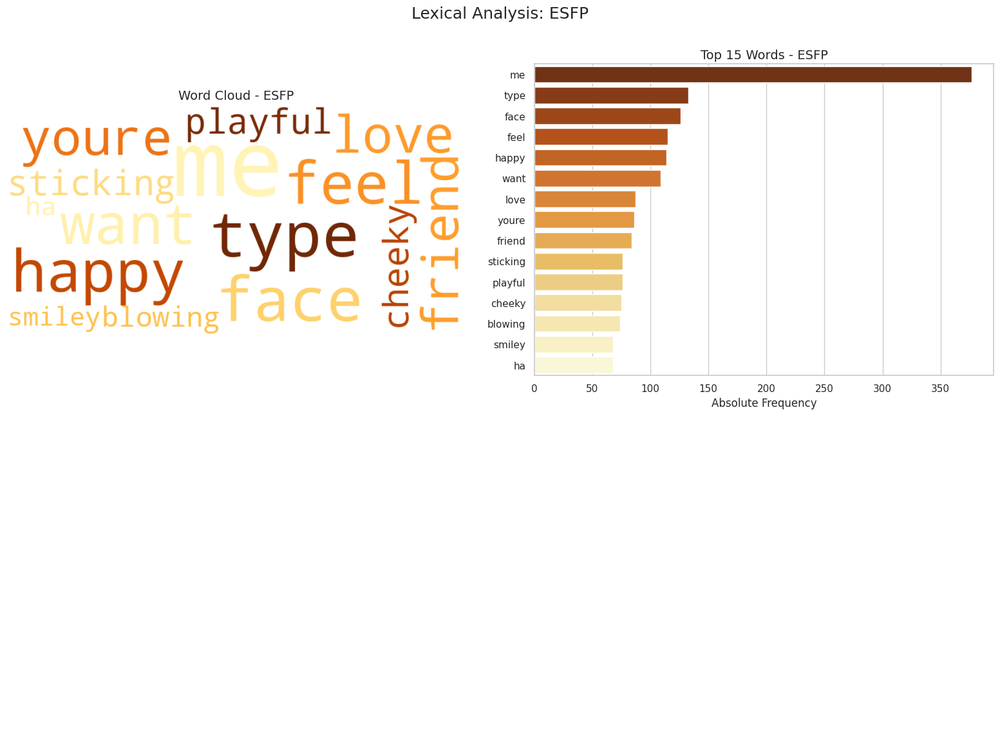

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


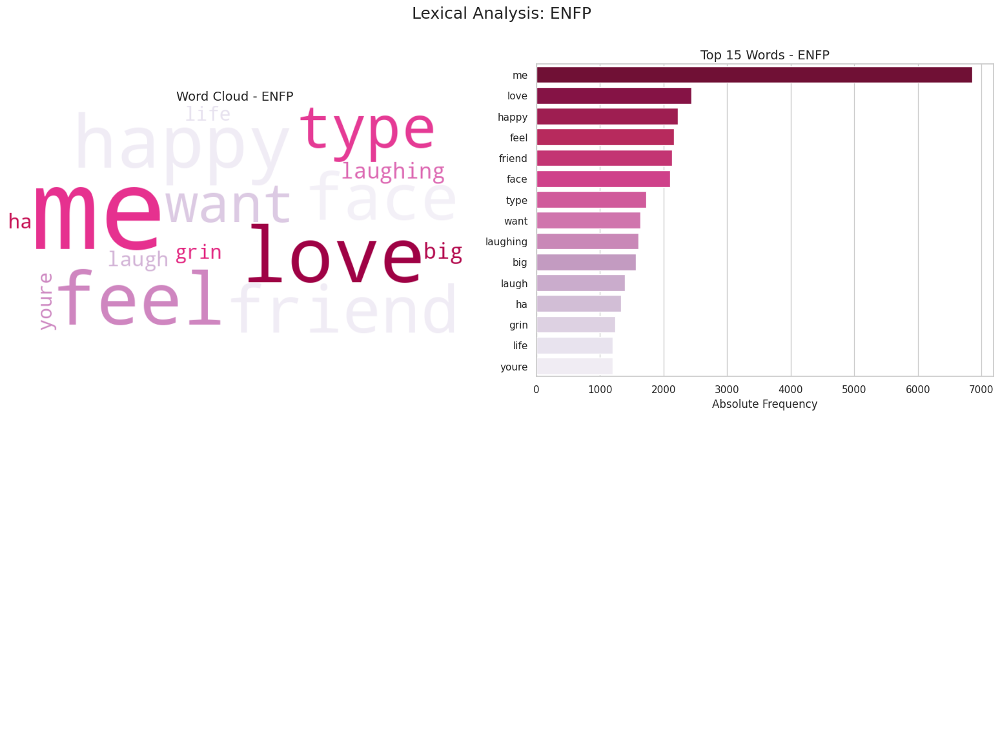

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


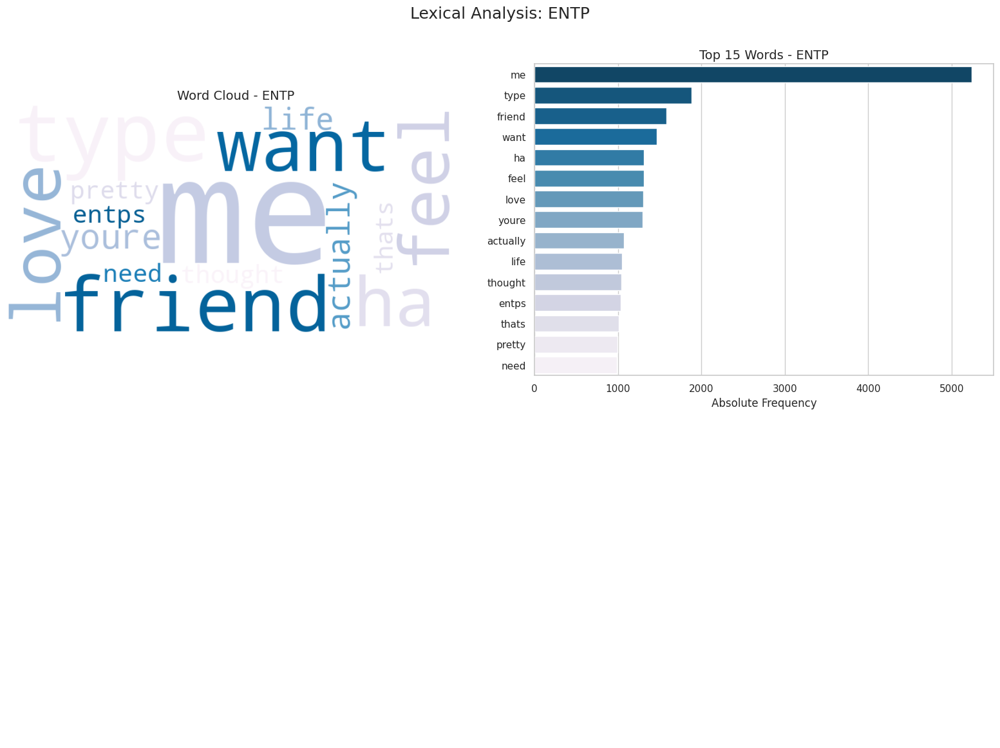

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


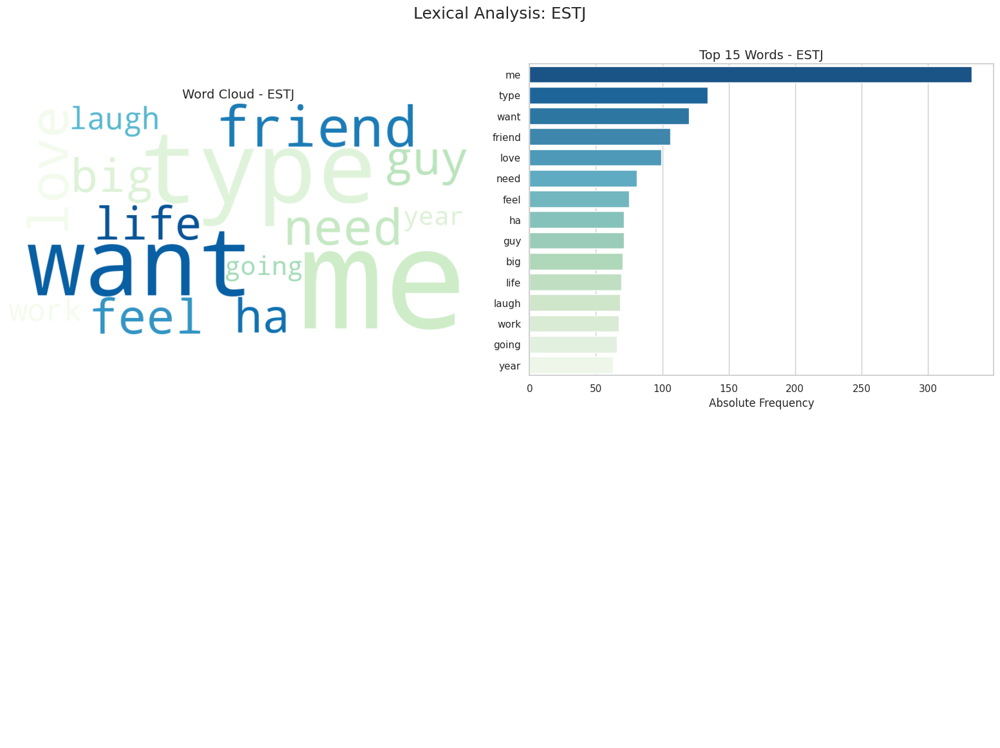

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


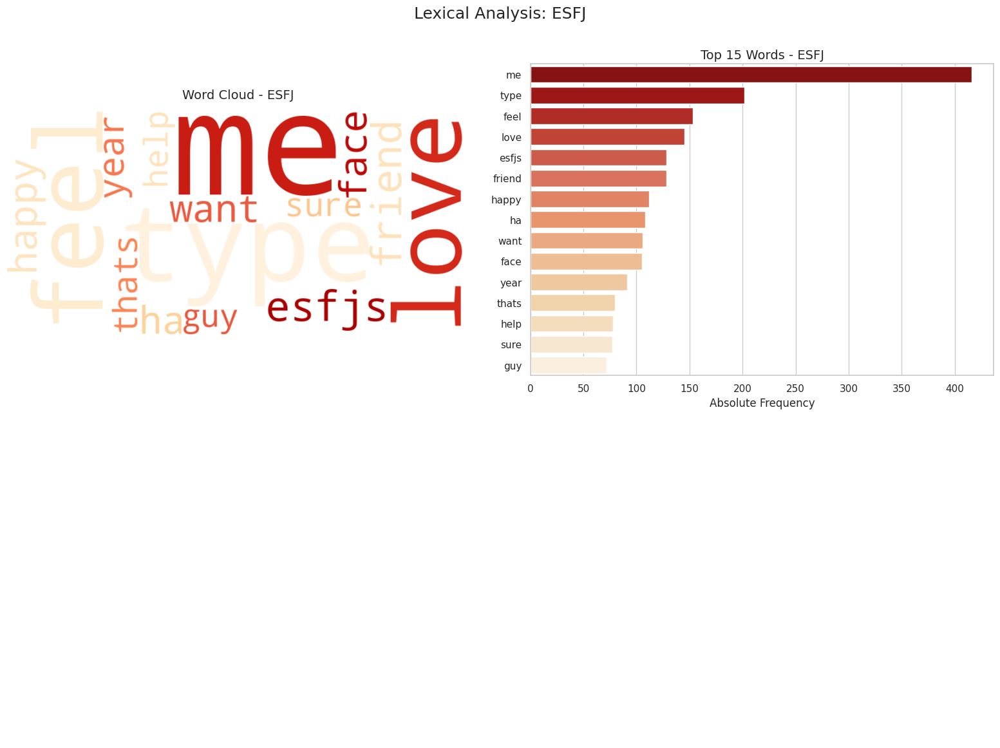

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


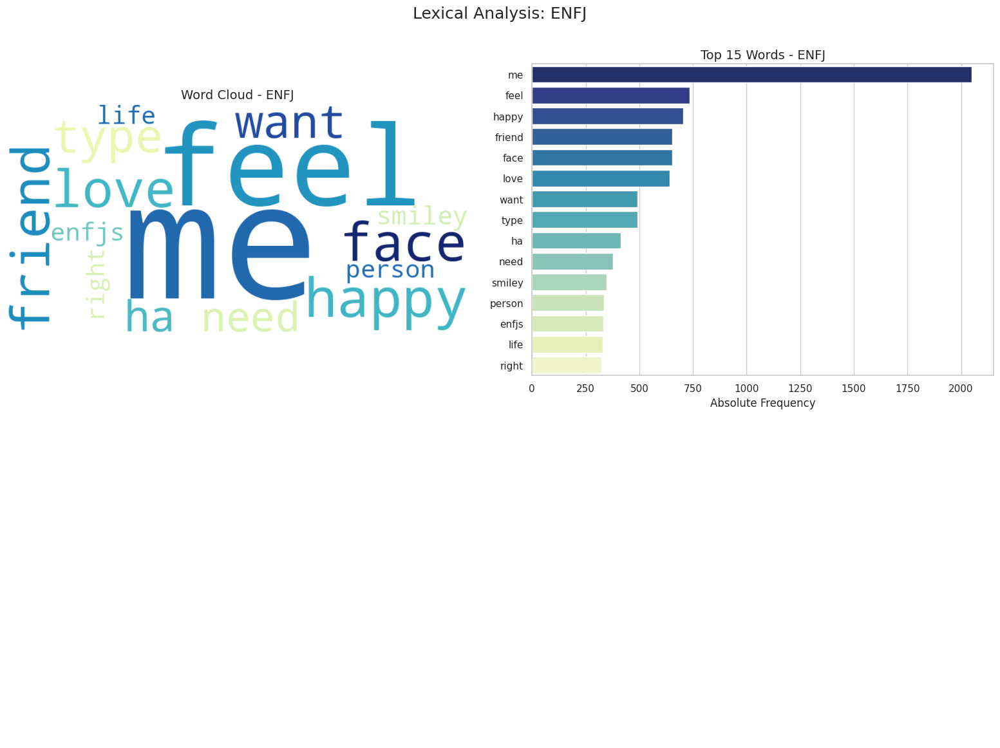

/tmp/ipykernel_774/3559253671.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')


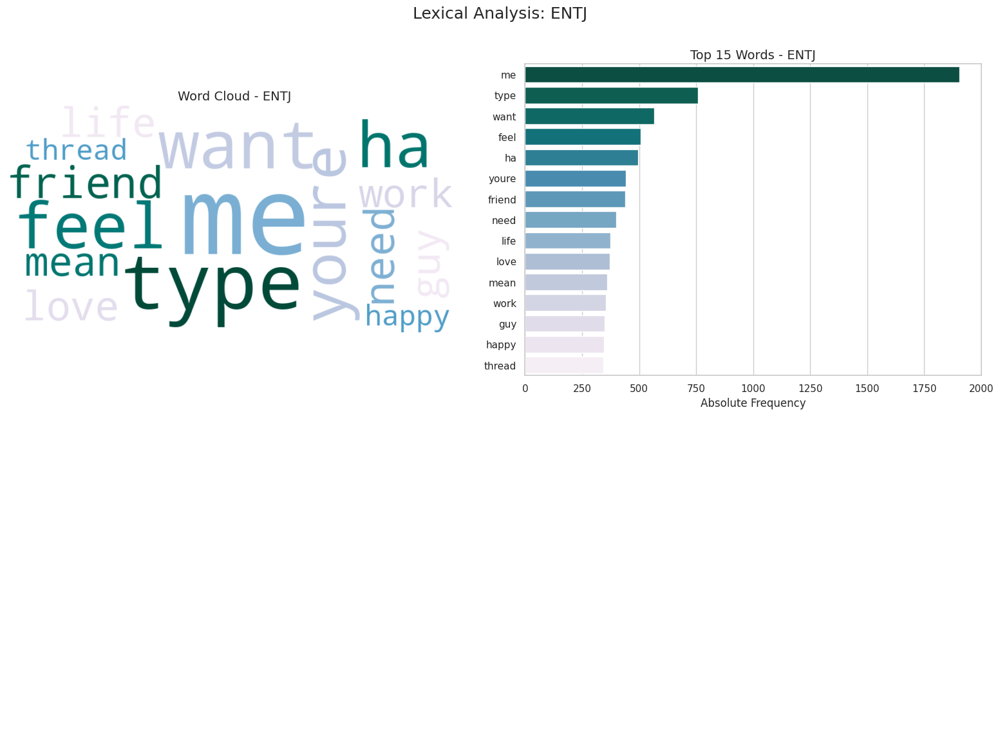

In [ ]:
words_to_keep = {"i", "me", "my", "mine", "myself", "we", "us", "our"}
forum_noise = {"im", "dont", "wa", "like", "think", "people", "know", "really", "thing", "time", "say", "make", "ive", "just", "lot", "good", "way"}
custom_stop_words = (set(ENGLISH_STOP_WORDS) | forum_noise) - words_to_keep

def get_top_n_words(corpus, n=15):
  vec = CountVectorizer(stop_words=list(custom_stop_words)).fit(corpus)
  bag_of_words = vec.transform(corpus)
  sum_words = bag_of_words.sum(axis=0)

  words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
  words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
  return words_freq[:n]

for mbti_type in mbti_types:
  personality_texts = mbti_df[
      mbti_df['type'] == mbti_type
  ] ['posts_clean']

  top_words = dict(get_top_n_words(personality_texts, 15))

  personality_color = mbti_colors[mbti_type]

  fig, axes = plt.subplots(2, 2, figsize=(16, 12))
  fig.suptitle(f'Lexical Analysis: {mbti_type}', fontsize=18)

  # Nuvem Das Personalidades
  wc = WordCloud(width=800, height=400, background_color='white', colormap=personality_color).generate_from_frequencies(top_words)
  axes[0, 0].imshow(wc, interpolation='bilinear')
  axes[0, 0].set_title(f'Word Cloud - {mbti_type}', fontsize=14)
  axes[0, 0].axis('off')

  # Barras Das Personalidades
  sns.barplot(ax=axes[0, 1], x=list(top_words.values()), y=list(top_words.keys()), palette=f'{personality_color}_r')
  axes[0, 1].set_title(f'Top 15 Words - {mbti_type}', fontsize=14)
  axes[0, 1].set_xlabel('Absolute Frequency')

  axes[1, 0].axis('off')
  axes[1, 1].axis('off')

  plt.tight_layout(pad=2.0)
  plt.show()

# Análises Gerais
Gera relatórios resumidos da distribuição do dataset tanto por eixos de personalidade (I/E, N/S, F/T, J/P) quanto pelas 16 classes MBTI. Exibe a contagem de amostras (Sample Count) e extrai as 10 palavras mais frequentes (Top 10 Words) de cada grupo usando CountVectorizer.

In [ ]:

def get_top_words(corpus, n=10):
    if len(corpus) == 0: return []

    vec = CountVectorizer(max_features=1000).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)

    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    return [word for word, freq in sorted(words_freq, key=lambda x: x[1], reverse=True)[:n]]

# RELATÓRIO 1: ANÁLISE POR EIXO (AXIS ANALYSIS)
axis_conditions = {
    'Introvert (I)': mbti_df['is_introvert'] == 1,
    'Extrovert (E)': mbti_df['is_introvert'] == 0,
    'Intuitive (N)': mbti_df['is_intuitive'] == 1,
    'Sensing (S)': mbti_df['is_intuitive'] == 0,
    'Feeling (F)': mbti_df['is_feeling'] == 1,
    'Thinking (T)': mbti_df['is_feeling'] == 0,
    'Judging (J)': mbti_df['is_judging'] == 1,
    'Perceiving (P)': mbti_df['is_judging'] == 0
}

axis_report = []
for axis_name, condition in axis_conditions.items():
    corpus = mbti_df[condition]['posts_clean'].astype(str)
    axis_report.append({
        'Axis_Trait': axis_name,
        'Sample_Count': len(corpus),
        'Top_10_Words': ", ".join(get_top_words(corpus, 10))
    })

axis_summary_df = pd.DataFrame(axis_report)



# RELATÓRIO 2: ANÁLISE PELAS 16 CLASSES (16 TYPES ANALYSIS)

types_report = []
mbti_types = mbti_df['type'].unique()

for mbti in mbti_types:
    corpus = mbti_df[mbti_df['type'] == mbti]['posts_clean'].astype(str)
    types_report.append({
        'MBTI_Type': mbti,
        'Sample_Count': len(corpus),
        'Top_10_Words': ", ".join(get_top_words(corpus, 10))
    })


types_summary_df = pd.DataFrame(types_report).sort_values(by='Sample_Count', ascending=False)

print("\n--- RESUMO POR EIXO ---")
display(axis_summary_df)

print("\n--- RESUMO PELAS 16 CLASSES ---")
display(types_summary_df.head(16))


--- RESUMO POR EIXO ---


,Axis_Trait,Sample_Count,Top_10_Words
0,Introvert (I),6676,"you, me, like, im, wa, dont, think, people, on..."
1,Extrovert (E),1999,"you, me, like, im, wa, think, dont, people, kn..."
2,Intuitive (N),7478,"you, me, like, im, wa, dont, think, people, on..."
3,Sensing (S),1197,"you, me, like, im, wa, dont, think, people, kn..."
4,Feeling (F),4694,"you, me, like, im, wa, think, dont, people, kn..."
5,Thinking (T),3981,"you, me, like, im, wa, dont, think, people, on..."
6,Judging (J),3434,"you, me, like, im, wa, dont, think, people, kn..."
7,Perceiving (P),5241,"you, me, like, im, wa, dont, think, people, on..."



--- RESUMO PELAS 16 CLASSES ---


,MBTI_Type,Sample_Count,Top_10_Words
6,INFP,1832,"you, me, like, im, wa, think, dont, people, re..."
0,INFJ,1470,"you, me, like, im, wa, think, dont, people, kn..."
2,INTP,1304,"you, me, like, im, wa, dont, think, people, on..."
3,INTJ,1091,"you, me, like, wa, im, dont, people, think, on..."
1,ENTP,685,"you, me, like, im, wa, think, dont, people, on..."
7,ENFP,675,"you, me, like, im, wa, think, dont, people, kn..."
9,ISTP,337,"you, me, like, im, dont, wa, think, people, ge..."
8,ISFP,271,"you, me, like, im, wa, dont, think, really, pe..."
4,ENTJ,231,"you, me, like, im, wa, dont, think, people, on..."
11,ISTJ,205,"you, me, like, im, wa, dont, think, people, on..."
